# Classifiez automatiquement des biens de consommation

**Enoncé de la mission**  
"Vous analyserez le jeu de données en réalisant un prétraitement des images et des descriptions des produits, une réduction de dimension, puis un clustering. Les résultats du clustering seront présentés sous la forme d’une représentation en deux dimensions à déterminer, qui ’illustrera le fait que les caractéristiques extraites permettent de regrouper des produits de même catégorie.
La représentation graphique vous aidera à convaincre Linda que cette approche de modélisation permettra bien de regrouper des produits de même catégorie.
Attention, Linda n’a pas besoin d’un moteur de classification à ce stade, mais bien d’une étude de faisabilité !
Contraintes Linda vous a communiqué la contrainte suivante : afin d’extraire les features, mettre en œuvre a minima un algorithme de type SIFT / ORB / SURF.
Un algorithme de type CNN Transfer Learning peut éventuellement être utilisé en complément, s’il peut apporter un éclairage supplémentaire à la démonstration."

**Objectif de l'analyse présentée dans ce notebook**  
On cherchera à réaliser un apprentissage non-supervisé de catégories de produits en utilisant simplement les caractéristiques liées aux images. Ces caractéristiques seront dans un premier temps celles générées par l'algorithme SIFT (scale-invariant feature transform), et l'utilisation de cet algorithme supposera un prétraitement appliqué aux images de manière à améliorer la détection et la création de ces caractéristiques. 
Dans un deuxième temps, on utilisera un réseau de neurones à convolution (Convolution Neural Network, CNN) auquel on délèguera la détection de _features_ qui serviront ensuite de base pour la segmentation en catégories. Dans cette deuxième partie l'étape de prétraitement est implémentée via une fonction dédiée de la bibliothèque keras.



### Quelques idées de preprocessing à appliquer:
- local rank filter, high-pass filter, or sharpen filter
- noise-removal
- a local histogram equalization, LUT remap, rank filter, sharpen filter`

* **Speckle, random noise.** This type of noise is apparently random,
and can be removed using a rank filter or median filter.
* **Transient frequency spike.** This can be determined using a
Fourier spectrum and can be removed using a notch filter over
the spike; the frequency spike will likely be in an outlier region of
the spectrum, and may manifest as a bright spot in the image.

The most basic approach is to remove outliers, and various approaches are taken, including thresholding
and local region based statistical filters such as the rank filter and median filter

**Color Segmentation**\
Sometime color alone can be used to segment and threshold. Using the right color
component can easily filter out features from an image. For example, in Figure 2-6, we
started from a red channel image from an RGB set, and the goal was to segment out the
USB sticks from the table background. Since the table is brown and contains a lot of red,
the red channel provides useful contrast with the USB sticks allowing segmentation via
red. It may be necessary to color-correct the image to get the best results, such as gamut
corrections or boosting the hue or saturation of each color to accentuate difference.

**Histogram Equalization and Specification**\
Histogram equalization spreads pixel values between a floor and ceiling using a contrast
remapping function, with the goal of creating a histogram with approximately equal bin
counts approaching a straight-line distribution. While this method works
well for gray scale images, color images should be equalized in the intensity channel of
a chosen color space, such as HSV V. Equalizing each RGB component separately and
rerendering will produce color moiré artifacts. Histogram equalization uses a fixed region
and a fixed remapping for all pixels in the region; however, adaptive local histogram
equalization methods are available.

**Local Histogram Equalization**\
Local histogram equalization divides the image into small blocks, such as 32x32 pixels,
and computes a histogram for each block, then rerenders each block using histogram
equalization. However, the contrast results may contain block artifacts corresponding
to the chosen histogram block size. There are several variations for local histogram
equalization, including Contrast Limited Adaptive Local Histogram Equalization
(CLAHE).

Les quelques lignes suivantes permettent, dans le cas d'un lancement sur google colab, de charger les données nécessaires pour faire fonctionner ce notebook. 

# Executer si le notebook est lancé dans Colaboratory

In [6]:
RunningInCOLAB = 'google.colab' in str(get_ipython())

if RunningInCOLAB:

    # install opencv library
    ! pip install opencv-python --upgrade opencv-python
    ! pip install hdbscan

    # mount drive to get custom modules and data
    from google.colab import drive
    drive.mount('/content/drive')

    # importation des modules - nécessaire sous Google Colab
    !cp /content/drive/MyDrive/OpenClassrooms_projects/P6/*.py /content/

In [4]:
# standard imports
from glob import glob
import pickle
import warnings
warnings.filterwarnings('ignore')

# third party imports
import pandas as pd
import numpy as np
from numpy.random import default_rng
from PIL import Image
import skimage
from skimage import io
from skimage import restoration
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from sklearn import preprocessing
from sklearn import manifold
from sklearn import cluster
from sklearn import metrics
import cv2
import missingno as msno
from tqdm import tqdm
from tensorflow import keras
import keras.applications.vgg16 as vgg16
import keras.layers as layers
from keras import Model
from keras.preprocessing.image import load_img, img_to_array


# local imports
import custom
import imageprocessing as imp

/anaconda3/lib/python3.7/site-packages/pandas/compat/_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.9' currently installed).
  warnings.warn(msg, UserWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:37: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  LARGE_SPARSE_SUPPORTED = LooseVersion(scipy_version) >= '0.14.0'
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:

ImportError: Traceback (most recent call last):
  File "/anaconda3/lib/python3.7/site-packages/tensorflow/python/pywrap_tensorflow.py", line 64, in <module>
    from tensorflow.python._pywrap_tensorflow_internal import *
ImportError: dlopen(/anaconda3/lib/python3.7/site-packages/tensorflow/python/_pywrap_tensorflow_internal.so, 6): Symbol not found: _SecKeyCopyExternalRepresentation
  Referenced from: /anaconda3/lib/python3.7/site-packages/tensorflow/python/../libtensorflow_framework.2.dylib
  Expected in: /System/Library/Frameworks/Security.framework/Versions/A/Security
 in /anaconda3/lib/python3.7/site-packages/tensorflow/python/../libtensorflow_framework.2.dylib


Failed to load the native TensorFlow runtime.

See https://www.tensorflow.org/install/errors

for some common reasons and solutions.  Include the entire stack trace
above this error message when asking for help.


# Sommaire
**[I Préparation des données](#I-Préparation-des-données)**
* [I.1 Chargement du dataset](#I.1-Chargement-du-dataset)
* [I.2 Préparation des catégories](#I.2-Préparation-des-catégories)

**[II Exploration du jeu d'images](#II-Exploration-du-jeu-d'images)**
* [II.0 Chargement du jeu d'images](#II.0-Chargement-du-jeu-d'images)


* [II.1 Affichage d'exemples d'images par label](#II.1-Affichage-d'exemples-d'images-par-label)
    * [II.1.1 Toutes les catégories](#II.1.1-Toutes-les-catégories)
    * [II.1.2 Catégories individuelles](#II.1.2-Catégories-individuelles)


* [II.2 Statistiques sur les catégories d'images](#II.2-Statistiques-sur-les-catégories-d'images)
    * [II.2.1 Catégories](#II.2.1-Catégories)
    * [II.2.2 Y a-t-il de fausses images dans le jeu de données?](#II.2.2-Y-a-t-il-de-fausses-images-dans-le-jeu-de-données?)
    * [II.2.3 Bruit gaussien](#II.2.3-Bruit-gaussien)
    * [II.2.4 Formats - tailles et ratios hauteur/largeur](#II.2.4-Formats---tailles-et-ratios-hauteur/largeur)


* [II.3 Prétraitement des images](#II.3-Prétraitement-des-images)
    * [II.3.1 Correction de l'exposition - étirement de l'histogramme](#II.3.1-Correction-de-l'exposition---étirement-de-l'histogramme)
    * [II.3.2 Correction du contraste - égalisation de l'histogramme](#II.3.2-Correction-du-contraste---égalisation-de-l'histogramme)
    * [II.3.3 Egalisation adaptative limitée en contraste](#II.3.3-Egalisation-adaptative-limitée-en-contraste)
    * [II.3.4 Réduction de la taille des images](#II.3.4-Réduction-de-la-taille-des-images)


* [II.4 Pipeline de prétraitement](#II.4-Pipeline-de-prétraitement)

**[III Détection des features avec SIFT](#III-Détection-des-features-avec-SIFT)**
* [III.1 Création des descripteurs](#III.1-Création-des-descripteurs)
* [III.2 Création des _visual words_](#III.2-Création-des-visual-words)
* [III.3 Création des features des images](#III.3-Création-des-features-des-images)
* [III.4 Réductions de dimension](#III.4-Réductions-de-dimension)
  * [III.4.1 Réduction de dimension PCA](#III.4.1-Réduction-de-dimension-PCA)
  * [III.4.2 Réduction de dimension T-SNE](#III.4.2-Réduction-de-dimension-T-SNE)
  * [III.4.3 Analyse visuelle : affichage T-SNE selon catégories d'images](#III.4.3-Analyse-visuelle-:-affichage-T-SNE-selon-catégories-d'images)
  * [III.4.4 Analyse mesures : similarité entre catégories et clusters](#III.4.4-Analyse-mesures-:-similarité-entre-catégories-et-clusters)
  
**[IV CNN et Transfer learning](#IV-CNN-et-Transfer-learning)**
* [IV.1 Création et récupération des _features_ des images à partir du modèle pré entraîné](#IV.1-Création-et-récupération-des-_features_-des-images-à-partir-du-modèle-pré-entraîné)
* [IV.2 Modèle avec apprentissage partiel](#IV.2-Modèle-avec-apprentissage-partiel)


On commence par charger le jeu de données dont on extrait les colonnes pertinentes:
- les noms des fichiers d'image (colonne 'image')
- les catégories (colonne product_category)

Cette dernière est contient en réalité une catégorisation hiérarchique de chaque produit, allant jusqu'à 6 niveaux. On en extrait que le premier niveau (c'est-à-dire le niveau le plus général et présentant le moins de catégories différentes) dans le cadre de cette analyse

# I Préparation des données

## I.1 Chargement du dataset

In [11]:
if RunningInCOLAB:
    path = '/content/drive/MyDrive/OpenClassrooms_projects/P6/data/Flipkart/flipkart_com-ecommerce_sample_1050.csv'
else:
    path = None

data = custom.load_data(path)
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


## I.2 Préparation des catégories

Analyse rapide des catégories de produit, et extraction du premier niveau de catégories, qui contient 7 niveaux différents.

In [12]:
categories = custom.category_trees(data)
categories.head()

,0,1,2,3,4,5,6
0,Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet ...,None,None,None
1,Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red,...",None,None
2,Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE ...,None,None
3,Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King size...,None,None
4,Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,Jaipur Print Cotton Floral King sized Double B...,None,None


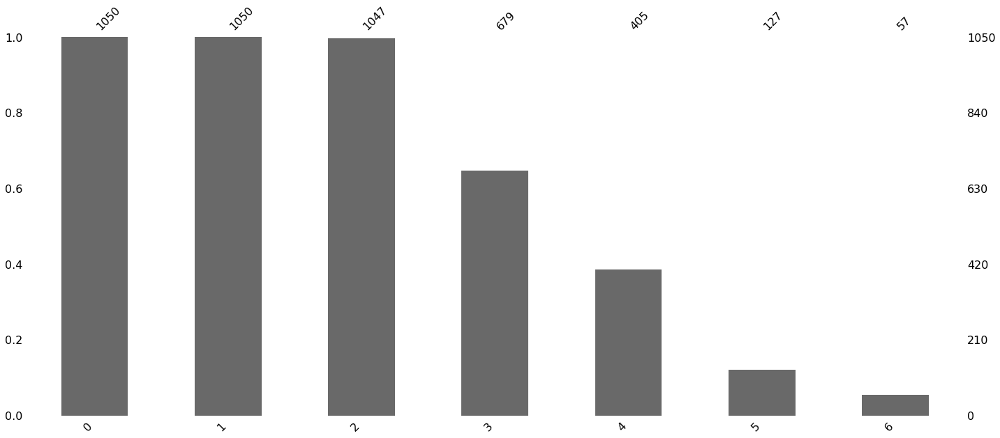

In [13]:
msno.bar(categories)

Tous les niveaux de catégories ne sont pas également renseignés, et seuls les deux premiers le sont totalement.

In [6]:
categories.nunique()

0      7
1     62
2    241
3    349
4    297
5    117
6     57
dtype: int64

Le premier niveau ne contient que 7 catégories différentes, et nombre passe à 62 dès le niveau suivant. Bien qu'il n'y ait pas en réalité 7*62 = 434 catégories différentes au toal dans les données que nous avons, le nombre élevé de catégories dans le deuxième niveau nous conduit à ne conserver que le premier dans le cadre de cette analyse.

In [14]:
data["product_category"] = custom.extract_categories_from_tree(data)
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,product_category
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing


In [15]:
data = data[["image", "product_category"]]
del categories

Enfin, on termine par encoder les catégories sous forme numérique. L'encodage est réalisé grâce au LabelEncoder de la bibliothèque scikit-learn.

In [16]:
le = preprocessing.LabelEncoder()
labels = le.fit_transform(data["product_category"].to_numpy())

label_classes = le.classes_
label_categories = pd.Series(label_classes, name='label').to_frame()
label_categories['encoding'] = le.transform(label_categories.to_numpy().ravel())
label_categories

,label,encoding
0,Baby Care,0
1,Beauty and Personal Care,1
2,Computers,2
3,Home Decor & Festive Needs,3
4,Home Furnishing,4
5,Kitchen & Dining,5
6,Watches,6


# II Exploration du jeu d'images

## II.0 Chargement du jeu d'images

In [17]:
if RunningInCOLAB:
    # si notebook lancé sur google colaboratory
    PATH_TO_IMAGES = '/content/drive/MyDrive/OpenClassrooms_projects/P6/data/Flipkart/Images/'
    PATH_TO_FLIPKART = '/content/drive/MyDrive/OpenClassrooms_projects/P6/data/Flipkart/'
else:
    # si notebook lancé en local
    PATH_TO_IMAGES = './data/Flipkart/Images/'
    PATH_TO_FLIPKART = './data/Flipkart/'


print(PATH_TO_IMAGES)

./data/Flipkart/Images/


In [25]:
images = []
for f in tqdm(data.image):
    path = PATH_TO_IMAGES + f
    images.append(mpimg.imread(path))
IMAGES = np.asarray(images, dtype='object')

# cette variable n'est plus utile
del images

 64%|██████▍   | 677/1050 [01:02<00:39,  9.38it/s]/anaconda3/lib/python3.7/site-packages/PIL/Image.py:2600: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)
100%|██████████| 1050/1050 [01:59<00:00,  8.76it/s]


In [129]:
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

[('data', 173552),
 ('im', 138163),
 ('images_reduced', 9024),
 ('sigmas', 9024),
 ('im_stats', 8552),
 ('IM_CORR', 8504),
 ('labels', 8504),
 ('label_categories', 713),
 ('rng', 232),
 ('axes', 200),
 ('images_to_plot', 184),
 ('label_classes', 160),
 ('high_avg_im', 136),
 ('image', 136),
 ('literal_eval', 136),
 ('low_avg_im', 136),
 ('low_std_im', 136),
 ('norm_im', 136),
 ('fname', 118),
 ('f', 85),
 ('path', 82),
 ('Image', 80),
 ('cluster', 80),
 ('decomposition', 80),
 ('imageops', 80),
 ('manifold', 80),
 ('metrics', 80),
 ('mpimg', 80),
 ('msno', 80),
 ('np', 80),
 ('pd', 80),
 ('plt', 80),
 ('preprocessing', 80),
 ('restoration', 80),
 ('sns', 80),
 ('PATH_TO_IMAGES', 72),
 ('default_rng', 72),
 ('PATH_TO_FLIPKART', 65),
 ('ax', 56),
 ('ax1', 56),
 ('ax2', 56),
 ('ax3', 56),
 ('ax4', 56),
 ('ax5', 56),
 ('ax6', 56),
 ('ax7', 56),
 ('ax8', 56),
 ('fig', 56),
 ('le', 56),
 ('shape', 56),
 ('clahe', 32),
 ('high_avg_ind', 32),
 ('low_avg_ind', 32),
 ('low_std_ind', 32),
 ('sift

## II.1 Affichage d'exemples d'images par label

On commence par se donner un bon aperçu de la qualité du jeu de données en en affichant un échantillon.

### II.1.1 Toutes les catégories

In [14]:
if not RunningInCOLAB:
  from IPython.display import HTML, display
  imagesList=(''.join([ 
                       "<img style='width: 60px; margin: 0px; float: left; border: 1px solid black;' src={}/>"
                       .format(str(s)) for s in glob(PATH_TO_IMAGES+'*.jpg')[:100]])
             )

  display(HTML(data=imagesList))

else:
  print('No HTML display in Colab')

No HTML display in Colab


### II.1.2 Catégories individuelles

Une autre approche, complémentaire, consiste à inspecter (visuellement) les images en segmentant par les catégories de produit extraites du jeu de données initial.

**Watches**

In [ ]:
# catégories en présence
cat = 'Watches'
nb_images = 150

print(cat)
print("-------")
images_from_cat = data.loc[data.product_category==cat, "image"].sample(nb_images).index.to_list()
fig, axes = plt.subplots(nrows=15, ncols=10, figsize=(15, 15))
for im, ax in zip(images_from_cat, axes.ravel()):
    image = IMAGES[im]
    ax.imshow(image)
    ax.axis('off')
fig.tight_layout()

Watches
-------


**Computers**

Computers
-------


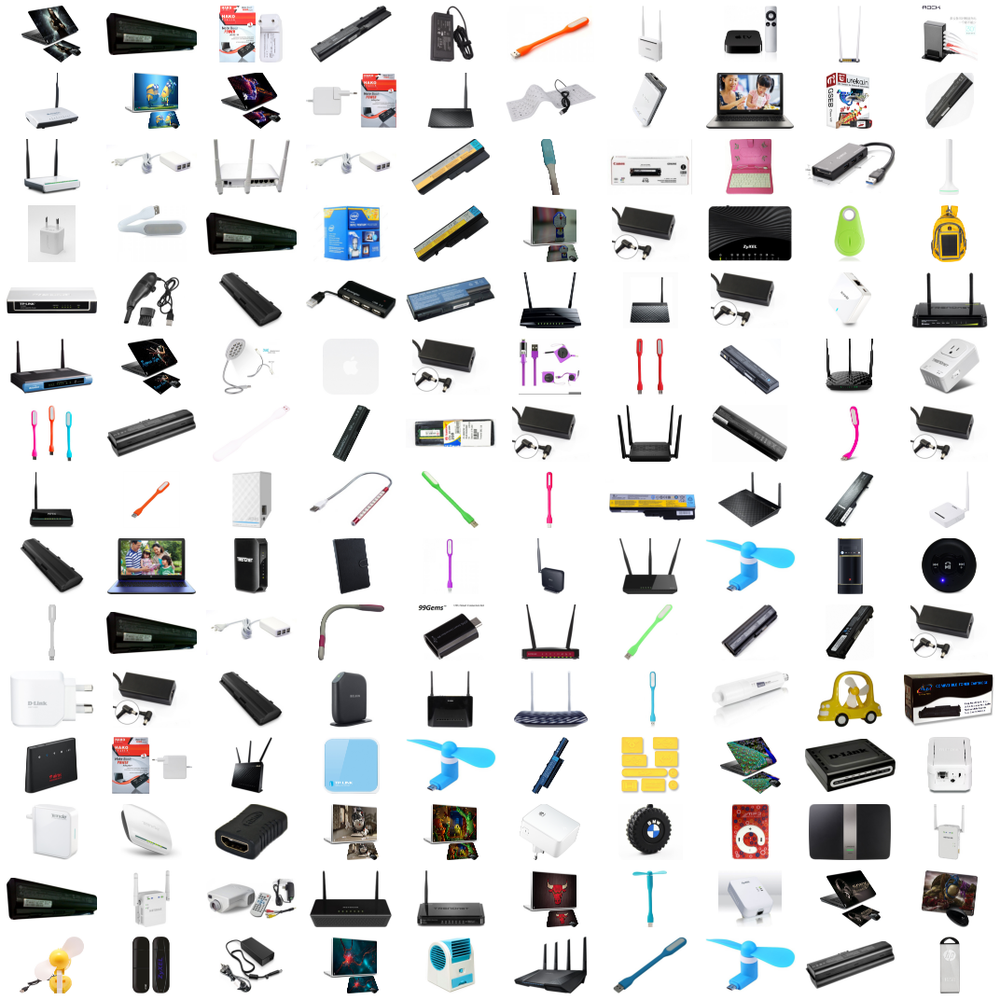

In [16]:
# catégories en présence
cat = 'Computers'
nb_images = 150

print(cat)
print("-------")
images_from_cat = data.loc[data.product_category==cat, "image"].sample(nb_images).index.to_list()
fig, axes = plt.subplots(nrows=15, ncols=10, figsize=(15, 15))
for im, ax in zip(images_from_cat, axes.ravel()):
    image = IMAGES[im]
    ax.imshow(image)
    ax.axis('off')
fig.tight_layout()

**Home Decor & Festive Needs**

Home Decor & Festive Needs
-------


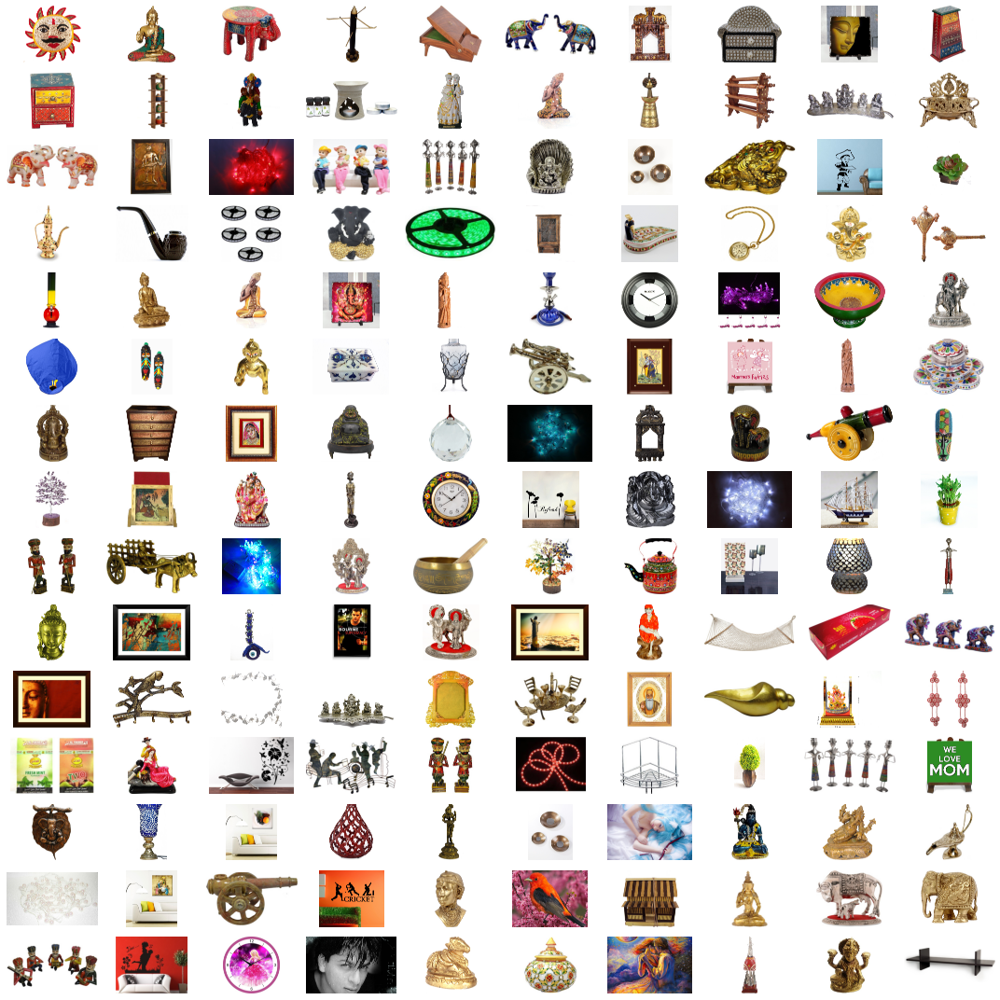

In [17]:
# catégories en présence
cat = 'Home Decor & Festive Needs'
nb_images = 150

print(cat)
print("-------")
images_from_cat = data.loc[data.product_category==cat, "image"].sample(nb_images).index.to_list()
fig, axes = plt.subplots(nrows=15, ncols=10, figsize=(15, 15))
for im, ax in zip(images_from_cat, axes.ravel()):
    image = IMAGES[im]
    ax.imshow(image)
    ax.axis('off')
fig.tight_layout()

**Baby Care**

Baby Care
-------


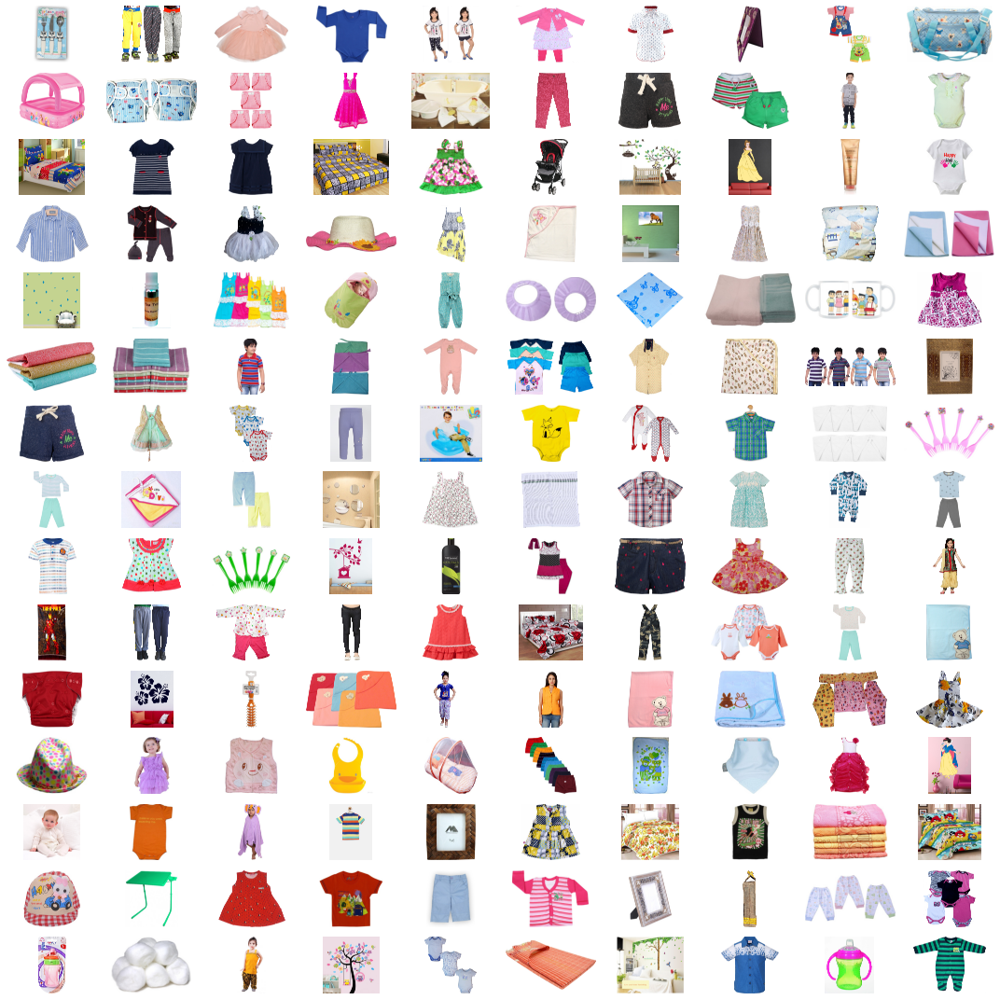

In [18]:
# catégories en présence
cat = 'Baby Care'
nb_images = 150

print(cat)
print("-------")
images_from_cat = data.loc[data.product_category==cat, "image"].sample(nb_images).index.to_list()
fig, axes = plt.subplots(nrows=15, ncols=10, figsize=(15, 15))
for im, ax in zip(images_from_cat, axes.ravel()):
    image = IMAGES[im]
    ax.imshow(image)
    ax.axis('off')
fig.tight_layout()

**Beauty and Personal Care**

Beauty and Personal Care
-------


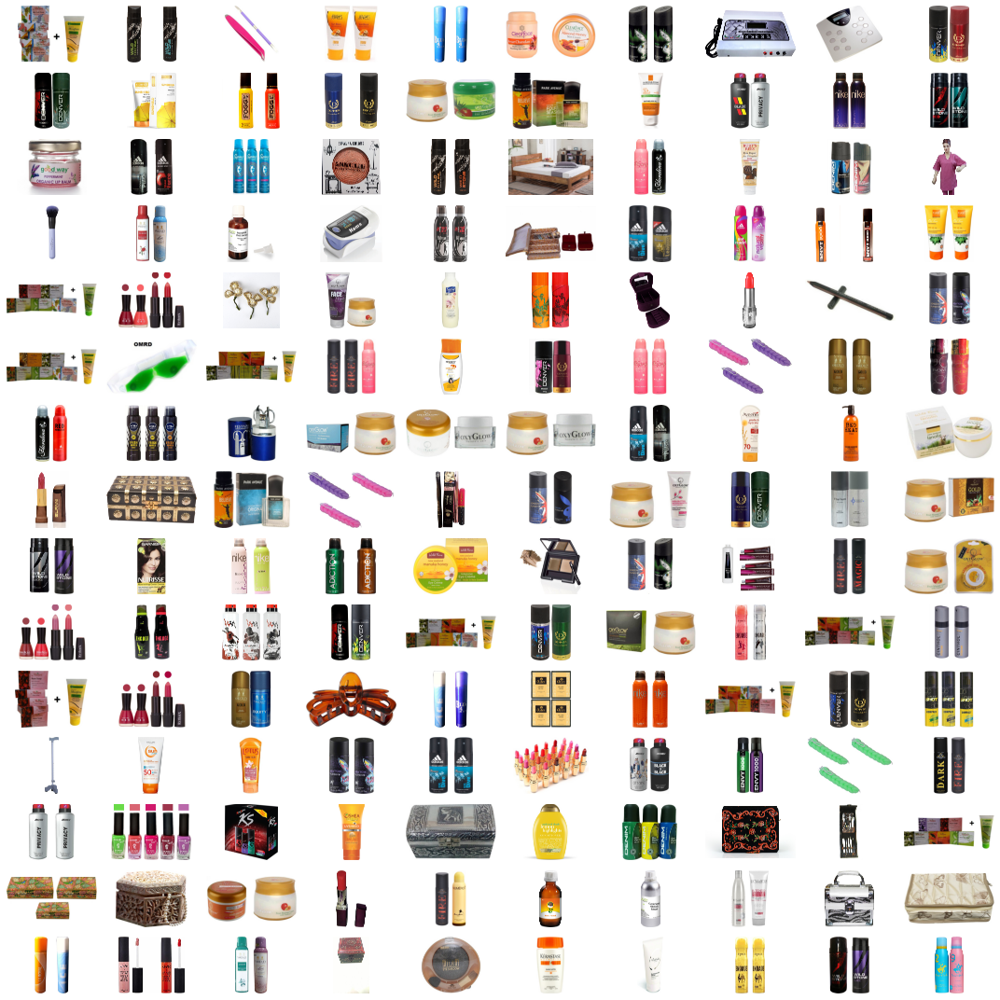

In [19]:
# catégories en présence
cat = 'Beauty and Personal Care'
nb_images = 150

print(cat)
print("-------")
images_from_cat = data.loc[data.product_category==cat, "image"].sample(nb_images).index.to_list()
fig, axes = plt.subplots(nrows=15, ncols=10, figsize=(15, 15))
for im, ax in zip(images_from_cat, axes.ravel()):
    image = IMAGES[im]
    ax.imshow(image)
    ax.axis('off')
fig.tight_layout()

**Home Furnishing**

Home Furnishing
-------


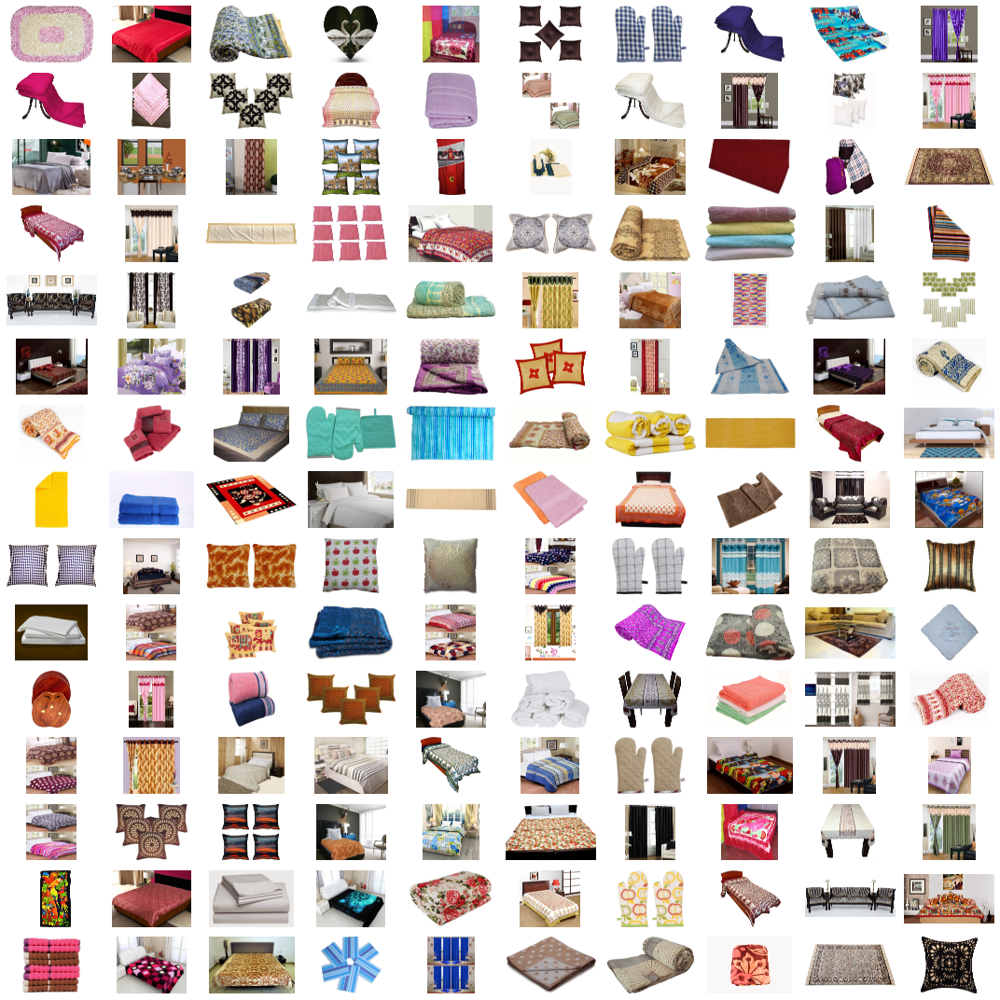

In [20]:
# catégories en présence
cat = 'Home Furnishing'
nb_images = 150

print(cat)
print("-------")
images_from_cat = data.loc[data.product_category==cat, "image"].sample(nb_images).index.to_list()
fig, axes = plt.subplots(nrows=15, ncols=10, figsize=(15, 15))
for im, ax in zip(images_from_cat, axes.ravel()):
    image = IMAGES[im]
    ax.imshow(image)
    ax.axis('off')
fig.tight_layout()

**Kitchen & Dining**

Kitchen & Dining
-------


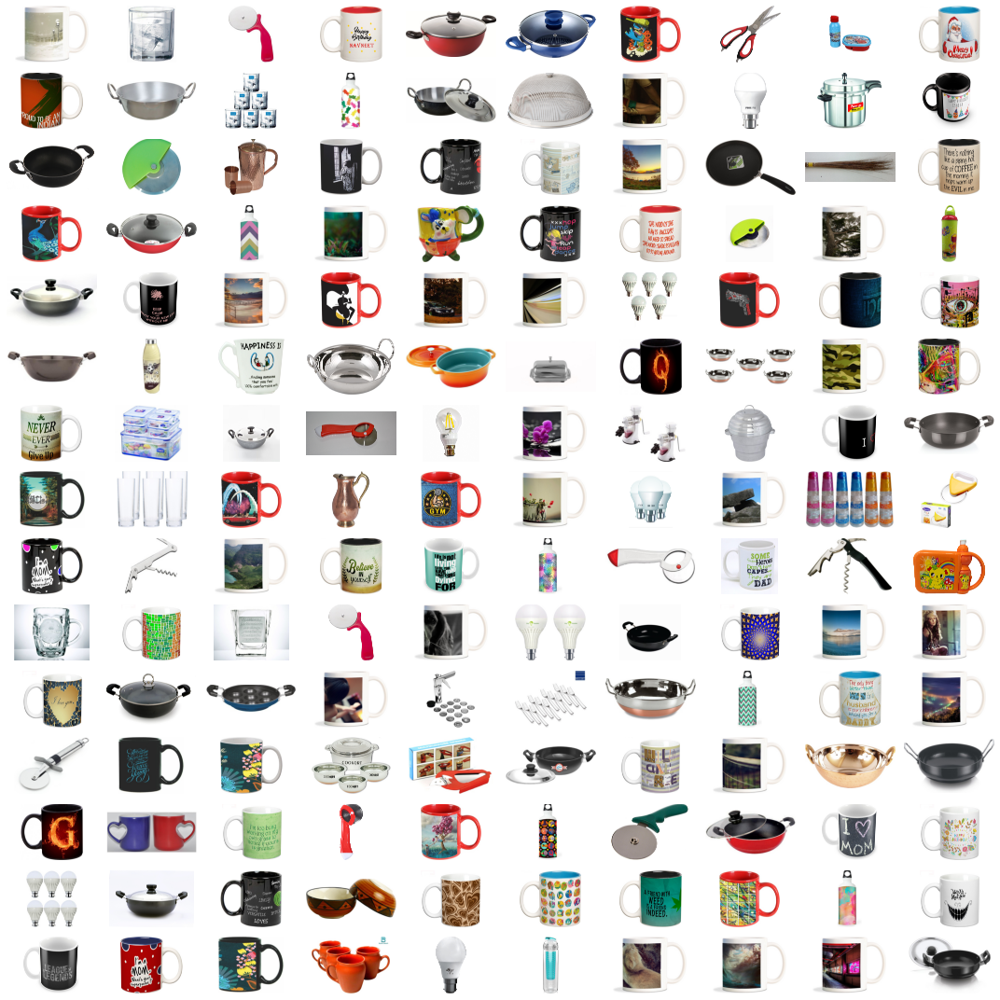

In [21]:
# catégories en présence
cat = 'Kitchen & Dining'
nb_images = 150

print(cat)
print("-------")
images_from_cat = data.loc[data.product_category==cat, "image"].sample(nb_images).index.to_list()
fig, axes = plt.subplots(nrows=15, ncols=10, figsize=(15, 15))
for im, ax in zip(images_from_cat, axes.ravel()):
    image = IMAGES[im]
    ax.imshow(image)
    ax.axis('off')
fig.tight_layout()

In [22]:
# on récupère l'espace lié à cette variable qui n'est plus utile
del images_from_cat

On peut déjà remarquer sur ces exemples que certaines caractéristiques (couleur, formes, rapport hauteur/largeur des images etc.) semblent en effet prendre des valeurs similaires au sein d'une catégorie, et varier sensiblement d'une catégorie à l'autre. Même si le jeu de données est limité à 1050 images, et que chaque catégorie comporte beaucoup de variabilité de caractéristiques évoquées au-dessus, ceci est plutôt encourageant vis-à-vis de notre objectif.

## II.2 Statistiques sur les catégories d'images

On cherche dans cette partie à acquérir une meilleure compréhension du jeu de données par l'évaluation de caractéristiques globales:
- nombre d'images par catégorie: les catégories sont-elles équilibrées?
- inspection des outliers: images blanches ou noires, de contraste très faible
- inspection des rapports hauteur/largeur: y a-t-il une corrélation entre ces rapports et les catégories d'images?
- bruit: le jeu de données est-il bruité?

### II.2.1 Catégories
**Combien d'images par catégorie? Les catégories sont-elles équilibrées?**

In [23]:
data.groupby('product_category').size()

product_category
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
dtype: int64

Parfait équilibre!

### II.2.2 Y a-t-il de fausses images dans le jeu de données?
**Y a-t-il des images 'blanches' ou 'noires'?**

In [27]:
# récupération des valeurs de chaque pixels pour chaque image
shape = (1050,)
min_values = np.empty(shape)
max_values = np.empty(shape)
std_values = np.empty(shape)
mean_values = np.empty(shape)

for i, im in enumerate(tqdm(IMAGES)):
    min_values[i], max_values[i], std_values[i], mean_values[i] = np.min(im), np.max(im), np.std(im), np.mean(im)

100%|██████████| 1050/1050 [04:57<00:00,  3.53it/s]


On commence par construire le dataframe des statistiques sur les distributions de pixels pour chaque image.\
Ce que l'on cherche à savoir, c'est si il y a des images pour lesquelles std() est nulle, ou mean() est égale à 0 ou 255 - ou une valeur proche de ces deux extrêmes.

In [ ]:
im_stats = np.concatenate([std_values.reshape(-1, 1),
                           mean_values.reshape(-1, 1)], axis=1)
del std_values, mean_values

In [42]:
im_stats = pd.DataFrame(im_stats).rename(columns={0:"std", 1:"mean"})

In [50]:
del min_values, max_values

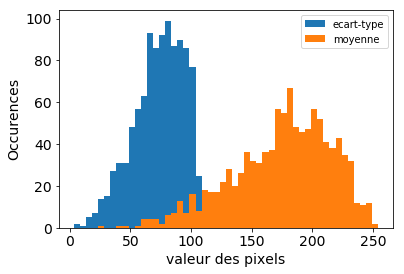

In [48]:
# Affichage des écart-types et valeurs moyennes

fig, ax = plt.subplots()
im_stats.plot(kind='hist', bins=round(5*np.log2(im_stats.shape[0])), ax=ax)

ax.yaxis.set_tick_params(labelsize=14)
ax.xaxis.set_tick_params(labelsize=14)
ax.set_xlabel("valeur des pixels",size=14)
ax.set_ylabel("Occurences", size=14)

plt.savefig('./images/imstats.png', dpi=300)
plt.show()

In [37]:
im_stats.to_csv('./data/im_stats.csv', index_label=False)

Affichons l'image dont la valeur moyenne des pixels est maximale (presque égale à 255)

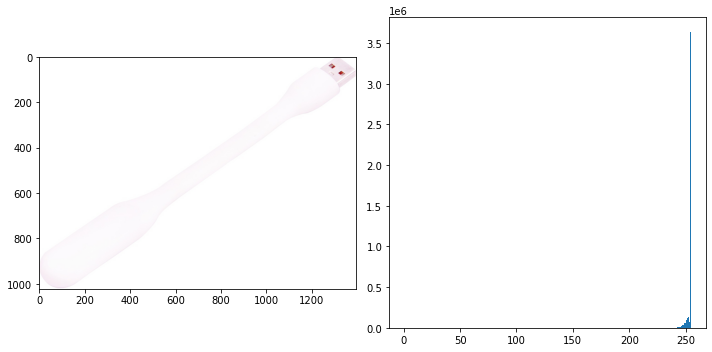

In [27]:
# chemin vers l'image
max_avg = im_stats['mean'].max()
ind = im_stats[im_stats["mean"]==max_avg].index[0]
im = IMAGES[ind]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5))
ax1.imshow(im)
ax2.hist(im.flatten(), bins=range(256))
plt.tight_layout()
plt.show()

Affichons l'image dont la répartition des pixels est la plus étroite (écart-type minimal)

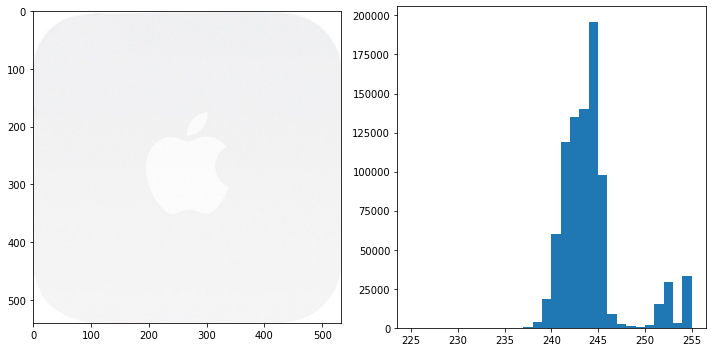

In [28]:
# indice de l'image
ind = im_stats[im_stats["std"]==np.min(std_values)].index[0]
im = IMAGES[ind]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5))
ax1.imshow(im)
ax2.hist(im.flatten(), bins=range(225, 256))
plt.tight_layout()
plt.show()

Ces images ont des contrastes très faibles, mais ne sont pas des images blanches.

### II.2.3 Bruit gaussien

On cherche ici à évaluer le bruit présent dans chaque image. On utilise la fonction estimate_sigma du module restoration la bibliothèque scikit-image.

In [49]:
sigmas = []
for im in tqdm(IMAGES):
    img = skimage.img_as_float(im)
    sigma_hat = restoration.estimate_sigma(img, average_sigmas=True, multichannel=True)
    sigmas.append(sigma_hat)

100%|██████████| 1050/1050 [13:49<00:00,  1.27it/s] 


In [52]:
del img

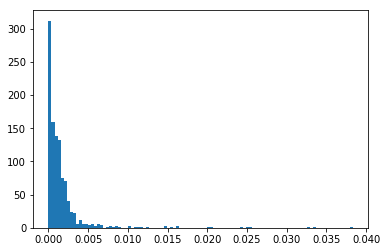

In [53]:
fig, ax = 
plt.hist(sigmas, bins=round(10*np.log2(len(sigmas))))
plt.show()

Il ne semble pas y avoir beaucoup de bruit... Inspectons les images pour lesquelles l'écart-type estimé est le plus important.

Valeur maximale de sigma relevée dans le jeu de données: 0.0383305292679823
Valeur sigmas_array[max_sigma]: 0.0383305292679823


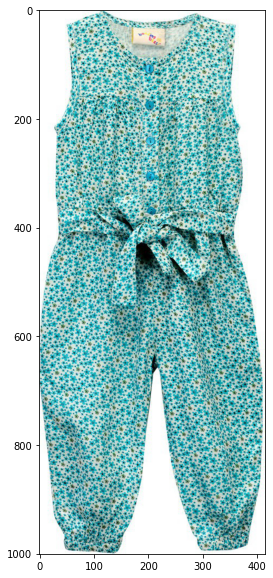

In [31]:
sigmas_array = np.array(sigmas)
print("Valeur maximale de sigma relevée dans le jeu de données: {}".format(np.max(sigmas_array)))

im = IMAGES[np.argmax(sigmas_array)]

fig = plt.figure(figsize=(10, 10))
plt.imshow(im)
plt.show()

Ce dataset ne semble pas bruité. On peut effacer la variable sigmas de façon à ne pas encombrer inutilement la RAM

In [32]:
del sigmas, sigma_hat, sigmas_array, max_sigma

### II.2.4 Formats - tailles et ratios hauteur/largeur

**D'abord, les ratios**

In [33]:
aspect_ratios = []
widths = []
heights = []


for im in tqdm(IMAGES):
    w = im.shape[1]
    h = im.shape[0]
    widths.append(w)
    heights.append(h)
    aspect_ratios.append(w/h)
data["width"] = widths
data["height"] = heights
data["aspect_ratio"] = aspect_ratios

100%|██████████| 1050/1050 [00:00<00:00, 375994.13it/s]


In [34]:
data.groupby('product_category')['aspect_ratio'].mean().sort_values()

product_category
Watches                       0.593142
Baby Care                     0.988174
Beauty and Personal Care      1.011452
Home Decor & Festive Needs    1.050514
Computers                     1.155929
Kitchen & Dining              1.252042
Home Furnishing               1.302537
Name: aspect_ratio, dtype: float64

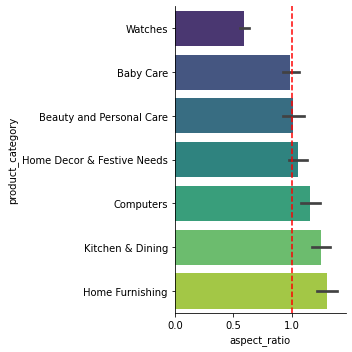

In [35]:
import matplotlib as mpl
sns.catplot(data=data,
            y="product_category", 
            x="aspect_ratio",
            kind='bar',
            palette='viridis',
           order=data.groupby('product_category')['aspect_ratio'].mean().sort_values().index)
plt.axvline(x=1, linestyle='--', color='r')
plt.show()

On a bien des ratios différents selon les catégories de produits.

**Puis, les tailles**

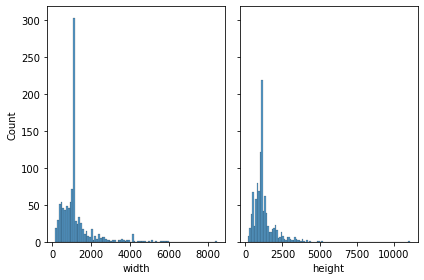

In [36]:
fig, (ax1, ax2) = plt.subplots(ncols=2, sharey=True)
sns.histplot(data=data, x="width", ax=ax1)
sns.histplot(data=data, x="height", ax=ax2)
plt.tight_layout()
plt.show()

Tailles moyennes

In [37]:
data.width.describe()

count    1050.000000
mean     1196.570476
std       864.076765
min       145.000000
25%       747.250000
50%      1100.000000
75%      1214.250000
max      8484.000000
Name: width, dtype: float64

In [38]:
data.height.describe()

count     1050.000000
mean      1220.038095
std        744.841368
min        160.000000
25%        844.000000
50%       1100.000000
75%       1360.000000
max      11042.000000
Name: height, dtype: float64

In [39]:
avg_width = data.width.mean()
avg_height = data.height.mean()

print("Largeur moyenne: {:.0f}".format(avg_width))
print("Hauteur moyenne: {:.0f}".format(avg_height))

Largeur moyenne: 1197
Hauteur moyenne: 1220


## II.3 Prétraitement des images

On explore dans cette partie différents traitements d'image. En particulier, on cherchera à évaluer l'impact de traitements standards sur notre jeu de données. 
- Correction de l'exposition, que l'on peut réaliser en étirement l'histogramme des couleurs/niveaux de gris de l'image,
- correction du contraste par l'égalisation de l'histogramme des couleurs,
- redimensionnement des images,

Ceci nous permettra ensuite de construire le pipeline de prétraitement en combinant ces traitements. 

### II.3.1 Correction de l'exposition - étirement de l'histogramme

Commençons par afficher l'image originale et son histogramme. Comme on décide ici de ne pas convertir les images en NB, on doit auparavant changer l'espace de couleurs utilisé. On teste sur les deux espaces cibles suivants:
- YCrCb, et on pourra alors agir sur le Y qui représente la luminance.
- HSV, et on agira alors sur la dernière composante qui représente les valeurs.

**1. YCrCb** 

Affichage de l'original

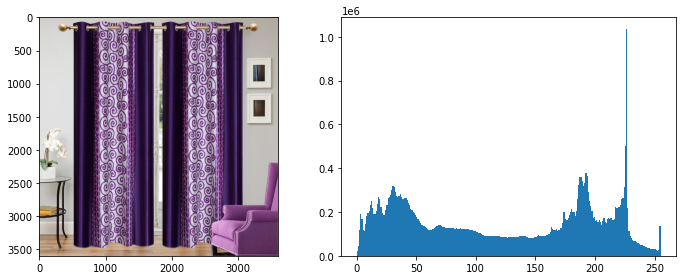

In [40]:
image = IMAGES[0]
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(image)
ax2.hist(image.flatten(), bins=range(256))
plt.tight_layout()
plt.show()

Affichage de l'image traitée

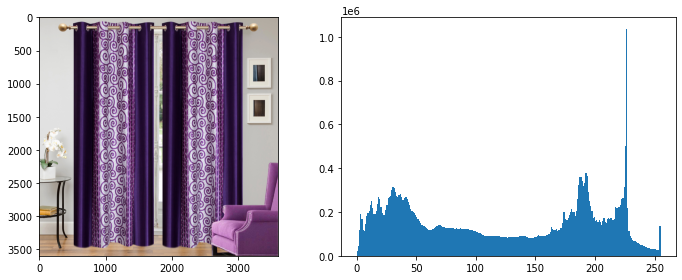

In [41]:
# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
img_ycc = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

# étirement de l'histogramme sur le canal Y
img_ycc[:, :, 0] = imp.custom_autocontrast(img_ycc[:, :, 0])

# convert image back from YCrCb to BGR
img = cv2.cvtColor(img_ycc, cv2.COLOR_YCrCb2RGB)


fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(np.asarray(img))
ax2.hist(np.asarray(img).flatten(), bins=range(256))
plt.tight_layout()
plt.show()

Pas de changement sur cette image comme on pouvait s'y attendre dans la mesure où son histogramme couvre déjà toute l'étendue. Inspectons l'effet de cette transformation sur les images présentant de faibles contrastes.

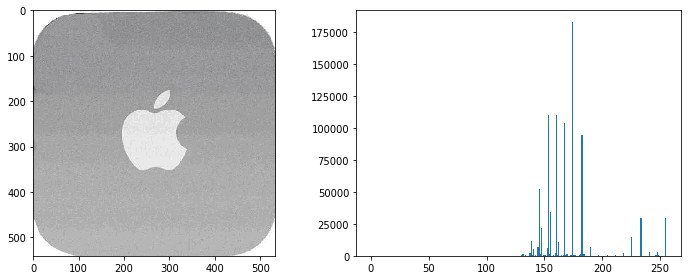

In [58]:
# on récupère l'image d'écart-type le plus bas
# indice de l'image
min_std = im_stats["std"].min()
low_std_ind = im_stats[im_stats["std"]==min_std].index[0]
low_std_im = IMAGES[low_std_ind]

# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
low_std_im_ycc = cv2.cvtColor(low_std_im, cv2.COLOR_RGB2YCrCb)

# étirement de l'histogramme sur le canal Y
low_std_im_ycc[:, :, 0] = imp.custom_autocontrast(low_std_im_ycc[:, :, 0])

# convert image back from YCrCb to BGR
img = cv2.cvtColor(low_std_im_ycc, cv2.COLOR_YCrCb2RGB)


fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(np.asarray(img))
ax2.hist(np.asarray(img).flatten(), bins=range(256))
plt.tight_layout()
plt.show()

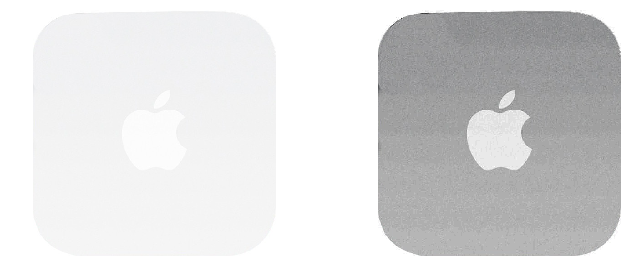

In [61]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(np.asarray(low_std_im))
ax2.imshow(np.asarray(img))
for ax in (ax1, ax2):
    ax.axis('off')
plt.savefig('./images/corr_exposition.png', dpi=300)
plt.tight_layout()
plt.show()

L'exposition est bien meilleure - on distingue bien l'image. Mais cela a fait apparaître des "bandes" de couleurs.

Inspection pas à pas:
1. On s'assure que l'image originale est bien dans le mode RGB, et on inspecte chacun des canaux avant traitement
2. On évalue l'effet du changement de l'espace de couleur
3. On évalue l'effet de l'étirement de l'histogramme

1. mode

In [43]:
# on récupère l'image d'écart-type le plus bas
# indice de l'image
low_std_ind = im_stats[im_stats["std"]==np.min(std_values)].index[0]
low_std_im = IMAGES[low_std_ind]
print("Mode de l'image: " + Image.fromarray(low_std_im).mode)

Mode de l'image: RGB


On affiche chacun des trois canaux indépendamment

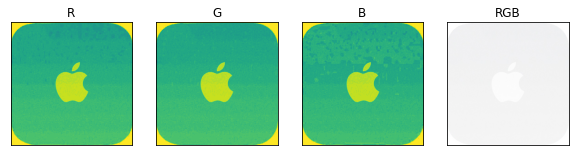

In [44]:
fig = plt.figure(figsize=(10, 10))
fig.add_subplot(141)
plt.imshow(low_std_im[:, :, 0])
plt.title('R'), plt.xticks([]), plt.yticks([])

fig.add_subplot(142)
plt.imshow(low_std_im[:, :, 1])
plt.title('G'), plt.xticks([]), plt.yticks([])

fig.add_subplot(143)
plt.imshow(low_std_im[:, :, 2])
plt.title('B'), plt.xticks([]), plt.yticks([])

fig.add_subplot(144)
plt.imshow(low_std_im)
plt.title('RGB'), plt.xticks([]), plt.yticks([])
plt.show()

On peut déjà voir des artefacts, notamment sur les canaux R et B.\
On réitère l'opération après passage dans l'espace HSV.

2. HSV

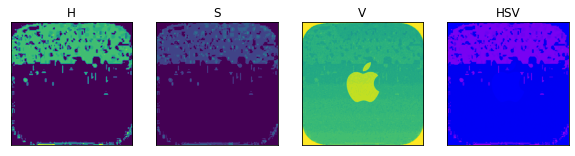

In [45]:
# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
low_std_im_hsv = cv2.cvtColor(low_std_im, cv2.COLOR_RGB2HSV)

fig = plt.figure(figsize=(10, 10))
fig.add_subplot(141)
plt.imshow(low_std_im_hsv[:, :, 0])
plt.title('H'), plt.xticks([]), plt.yticks([])

fig.add_subplot(142)
plt.imshow(low_std_im_hsv[:, :, 1])
plt.title('S'), plt.xticks([]), plt.yticks([])

fig.add_subplot(143)
plt.imshow(low_std_im_hsv[:, :, 2])
plt.title('V'), plt.xticks([]), plt.yticks([])

fig.add_subplot(144)
plt.imshow(low_std_im_hsv)
plt.title('HSV'), plt.xticks([]), plt.yticks([])
plt.show()

Et maintenant YCrCb

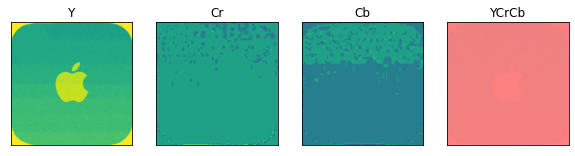

In [46]:
# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
low_std_im_ycc = cv2.cvtColor(low_std_im, cv2.COLOR_RGB2YCrCb)

fig = plt.figure(figsize=(10, 10))
fig.add_subplot(141)
plt.imshow(low_std_im_ycc[:, :, 0])
plt.title('Y'), plt.xticks([]), plt.yticks([])

fig.add_subplot(142)
plt.imshow(low_std_im_ycc[:, :, 1])
plt.title('Cr'), plt.xticks([]), plt.yticks([])

fig.add_subplot(143)
plt.imshow(low_std_im_ycc[:, :, 2])
plt.title('Cb'), plt.xticks([]), plt.yticks([])

fig.add_subplot(144)
plt.imshow(low_std_im_ycc)
plt.title('YCrCb'), plt.xticks([]), plt.yticks([])
plt.show()

Inutile d'évaluer l'effet de l'étirement de l'histogramme, les artefacts sont déjà présents dans les originaux.

On inspecte maintenant l'effet du traitement sur l'image la plus "blanche" en moyenne.

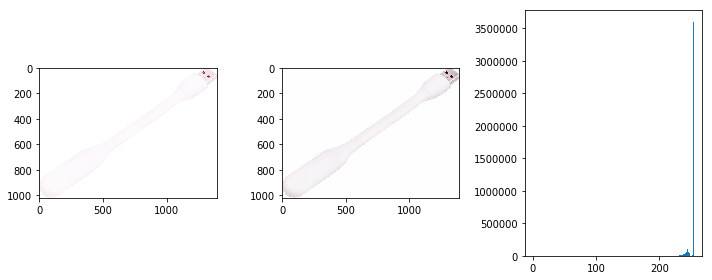

In [63]:
# on récupère l'image de valeur moyenne la plus élevée
# indice de l'image
max_mean = im_stats["mean"].max()
high_avg_ind = im_stats[im_stats["mean"]==max_mean].index[0]
high_avg_im = IMAGES[high_avg_ind]

# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
high_avg_im_ycc = cv2.cvtColor(high_avg_im, cv2.COLOR_RGB2YCrCb)

# étirement de l'histogramme sur le canal Y
high_avg_im_ycc[:, :, 0] = imp.custom_autocontrast(high_avg_im_ycc[:, :, 0], ignore=range(150))

# convert image back from YCrCb to BGR
img = cv2.cvtColor(high_avg_im_ycc, cv2.COLOR_YCrCb2RGB)


fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(10, 4))
ax1.imshow(high_avg_im)
ax2.imshow(img)
ax3.hist(np.asarray(img).flatten(), bins=range(256))
#ax2.set_ylim([0, 1e5])
plt.tight_layout()
plt.show()

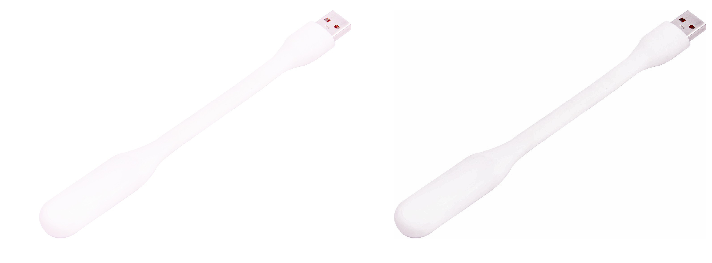

In [65]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(high_avg_im)
ax2.imshow(img)
for ax in (ax1, ax2):
    ax.axis('off')

plt.tight_layout()

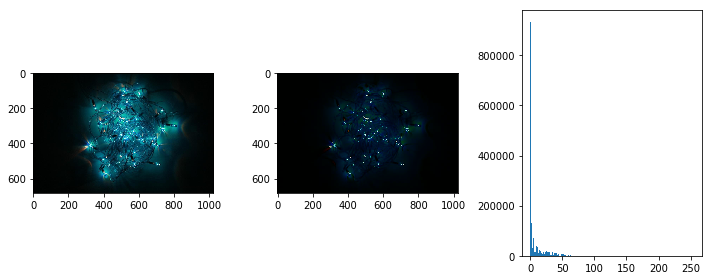

In [66]:
# on récupère l'image de valeur moyenne la plus élevée
# indice de l'image
min_mean = im_stats["mean"].min()
low_avg_ind = im_stats[im_stats["mean"]==min_mean].index[0]
low_avg_im = IMAGES[low_avg_ind]

# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
low_avg_im_ycc = cv2.cvtColor(low_avg_im, cv2.COLOR_RGB2YCrCb)

# étirement de l'histogramme sur le canal Y
low_avg_im_ycc[:, :, 0] = imp.custom_autocontrast(low_avg_im_ycc[:, :, 0], ignore=range(150))

# convert image back from YCrCb to BGR
low_img = cv2.cvtColor(low_avg_im_ycc, cv2.COLOR_YCrCb2RGB)


fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(10, 4))
ax1.imshow(low_avg_im)
ax2.imshow(low_img)
ax3.hist(np.asarray(low_img).flatten(), bins=range(256))
#ax2.set_ylim([0, 1e5])
plt.tight_layout()
plt.show()

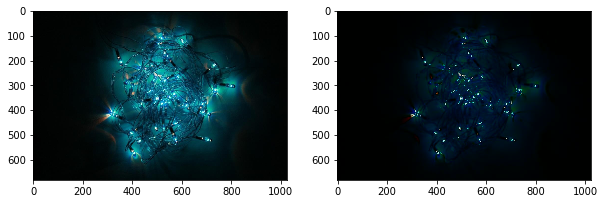

In [67]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(low_avg_im)
ax2.imshow(low_img)

En appliquant une valeur de cutoff très basse ou en ignorant les valeurs comprises entre 0 et 149 on obtient un résultat intéressant.

### II.3.2 Correction du contraste - égalisation de l'histogramme

On cherche maintenant à appliquer une correction sur le contraste des images. On teste sur les deux espaces cibles suivants, comme précédemment:
- YCrCb, et on pourra alors agir sur le Y qui représente la luminance.
- HSV, et on agira alors sur la dernière composante qui représente les valeurs.

**1. YCrCb** 

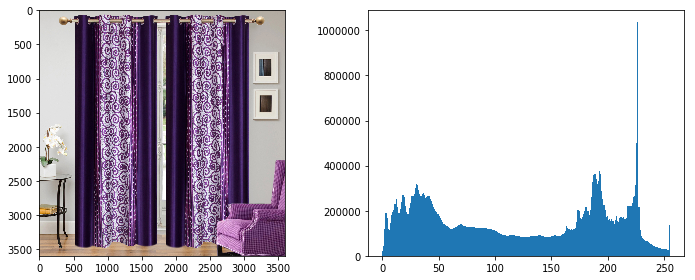

In [107]:
image = IMAGES[0]
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(image)
ax2.hist(image.flatten(), bins=range(256))
plt.tight_layout()
plt.show()

On change d'espace de couleur, et on applique l'égalisation (cv2.equalizeHist):

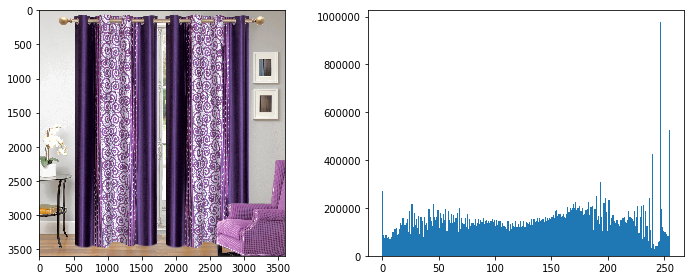

In [108]:
# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
img_ycc = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

# égalisation de l'histogramme sur le canal Y
img_ycc[:, :, 0] = cv2.equalizeHist(img_ycc[:, :, 0])

# convert image back from YCrCb to BGR
img = cv2.cvtColor(img_ycc, cv2.COLOR_YCrCb2RGB)


fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(np.asarray(img))
ax2.hist(np.asarray(img).flatten(), bins=range(256))
plt.tight_layout()
plt.show()

**2. HSV**

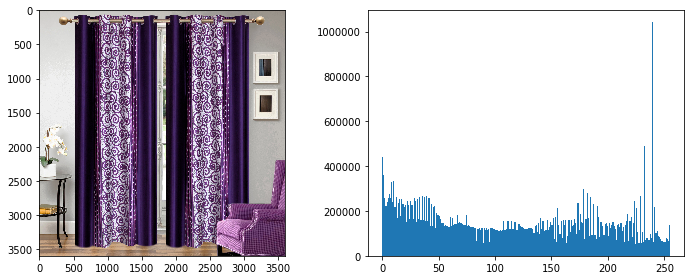

In [109]:
# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
img_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# égalisation de l'histogramme sur le canal Y
img_hsv[:, :, 2] = cv2.equalizeHist(img_hsv[:, :, 2])

# convert image back from YCrCb to BGR
img = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)


fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(np.asarray(img))
ax2.hist(np.asarray(img).flatten(), bins=range(256))
plt.tight_layout()
plt.show()

Utiliser YCrCb semble être plus performant pour cette tâche.

### II.3.3 Egalisation adaptative limitée en contraste

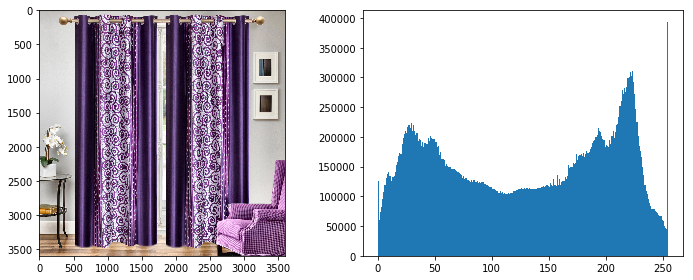

In [110]:
# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb
img_ycc = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

# Histogram equalisation on the Y-channel
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_ycc[:, :, 0] = clahe.apply(img_ycc[:, :, 0])

# convert image back from HSV to RGB
img = cv2.cvtColor(img_ycc, cv2.COLOR_YCrCb2RGB)

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4))
ax1.imshow(np.asarray(img))
ax2.hist(np.asarray(img).flatten(), bins=range(256))
plt.tight_layout()
plt.show()

On peut essayer de voir le résultat lorsqu'on applique successivement ces deux transformations sur l'image surexposée étudiée précédemment.

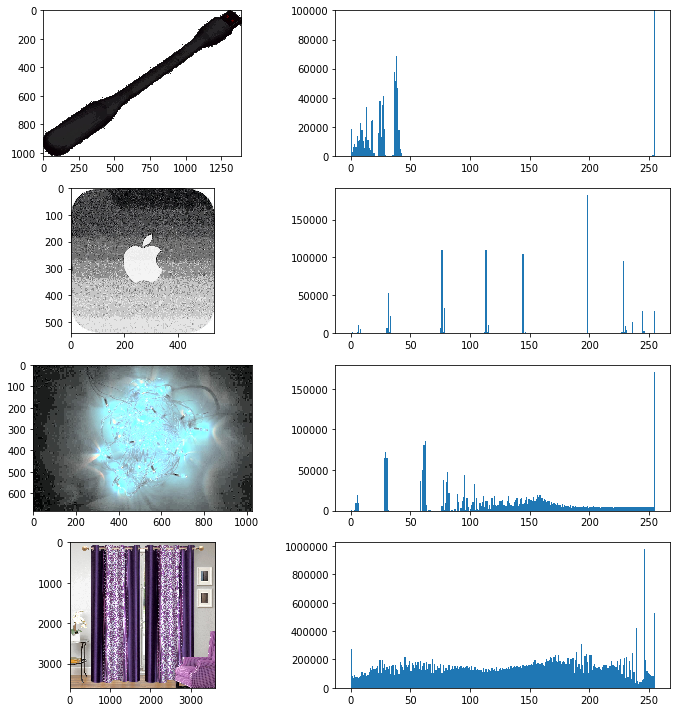

In [111]:
# on récupère l'image de moyenne la plus basse
# indice de l'image
min_mean = im_stats["mean"].min()
low_avg_ind = im_stats[im_stats["mean"]==min_mean].index[0]
low_avg_im = IMAGES[low_avg_ind]

# on récupère l'image de moyenne la plus élevée
# indice de l'image
max_mean = im_stats["mean"].max()
high_avg_ind = im_stats[im_stats["mean"]==max_mean].index[0]
high_avg_im = IMAGES[high_avg_ind]

# on récupère l'image d'écart-type le plus bas
# indice de l'image
min_std = im_stats["std"].min()
low_std_ind = im_stats[im_stats["std"]==min_std].index[0]
low_std_im = IMAGES[low_std_ind]

norm_im = IMAGES[0]
#
# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb

fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(10, 10))
im_corr = []
for i, im in enumerate([high_avg_im, low_std_im, low_avg_im, norm_im]):
    # convert image from RGB to YCrCb
    im_ycc = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)

    # étirement de l'histogramme sur le canal Y
    im_ycc[:, :, 0] = imp.custom_autocontrast(im_ycc[:, :, 0], cutoff=(0.025, 0))
    
    # égalisation de l'histogramme sur le canal Y
    im_ycc[:, :, 0] = cv2.equalizeHist(im_ycc[:, :, 0])


    # convert image back from YCrCb to BGR
    img = cv2.cvtColor(im_ycc, cv2.COLOR_YCrCb2RGB)
    
    im_corr.append(img)
    
ax1.imshow(np.asarray(im_corr[0]))
ax2.hist(np.asarray(im_corr[0]).flatten(), bins=range(256))
ax2.set_ylim([0, 1e5])
ax3. imshow(np.asarray(im_corr[1]))
ax4.hist(np.asarray(im_corr[1]).flatten(), bins=range(256))
ax5.imshow(np.asarray(im_corr[2]))
ax6.hist(np.asarray(im_corr[2]).flatten(), bins=range(256))
ax7.imshow(np.asarray(im_corr[3]))
ax8.hist(np.asarray(im_corr[3]).flatten(), bins=range(256))
plt.tight_layout()
plt.show()

La même chose avec CLAHE

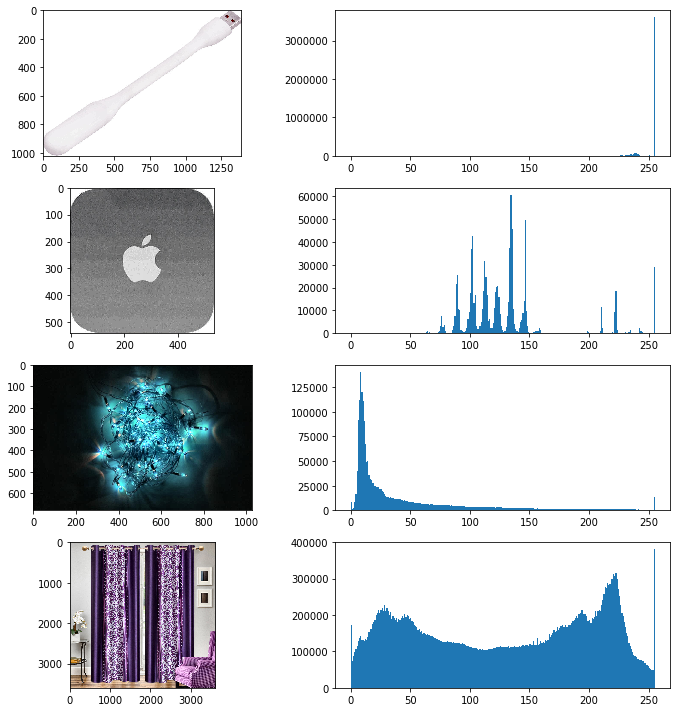

In [113]:
# on récupère l'image de moyenne la plus basse
# indice de l'image
min_mean = im_stats["mean"].min()
low_avg_ind = im_stats[im_stats["mean"]==min_mean].index[0]
low_avg_im = IMAGES[low_avg_ind]

# on récupère l'image de moyenne la plus élevée
# indice de l'image
max_mean = im_stats["mean"].max()
high_avg_ind = im_stats[im_stats["mean"]==max_mean].index[0]
high_avg_im = IMAGES[high_avg_ind]

# on récupère l'image d'écart-type le plus bas
# indice de l'image
min_std = im_stats["std"].min()
low_std_ind = im_stats[im_stats["std"]==min_std].index[0]
low_std_im = IMAGES[low_std_ind]

norm_im = IMAGES[0]

# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb

fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(10, 10))
im_corr = []

for i, im in enumerate([high_avg_im, low_std_im, low_avg_im, norm_im]):
    # convert image from RGB to YCrCb
    im_ycc = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)

    # étirement de l'histogramme sur le canal Y
    im_ycc[:, :, 0] = imp.custom_autocontrast(im_ycc[:, :, 0], cutoff=(0.025, 0))
    
    # Histogram equalisation on the Y-channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    im_ycc[:, :, 0] = clahe.apply(im_ycc[:, :, 0])

    # convert image back from YCrCb to BGR
    img = cv2.cvtColor(im_ycc, cv2.COLOR_YCrCb2RGB)
    
    im_corr.append(img)
    
ax1.imshow(np.asarray(im_corr[0]))
ax2.hist(np.asarray(im_corr[0]).flatten(), bins=range(256))
ax3. imshow(np.asarray(im_corr[1]))
ax4.hist(np.asarray(im_corr[1]).flatten(), bins=range(256))
ax5.imshow(np.asarray(im_corr[2]))
ax6.hist(np.asarray(im_corr[2]).flatten(), bins=range(256))
ax7.imshow(np.asarray(im_corr[3]))
ax8.hist(np.asarray(im_corr[3]).flatten(), bins=range(256))
plt.tight_layout()
plt.show()

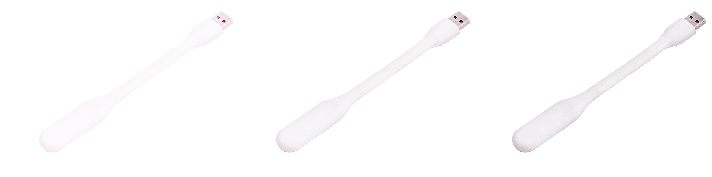

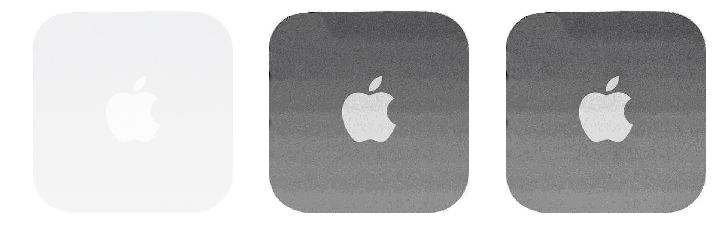

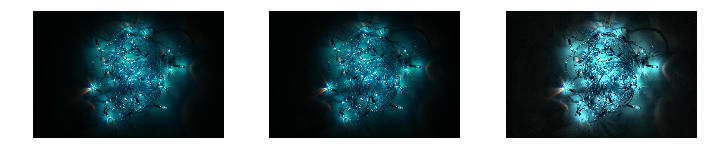

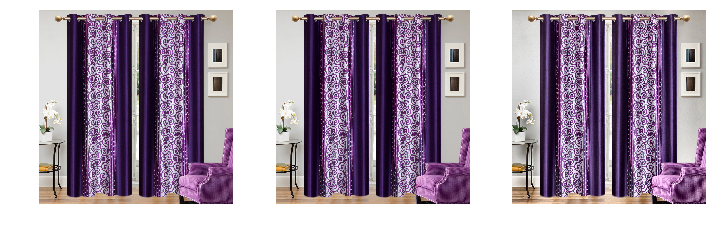

In [116]:
# on récupère l'image de moyenne la plus basse
# indice de l'image
min_mean = im_stats["mean"].min()
low_avg_ind = im_stats[im_stats["mean"]==min_mean].index[0]
low_avg_im = IMAGES[low_avg_ind]

# on récupère l'image de moyenne la plus élevée
# indice de l'image
max_mean = im_stats["mean"].max()
high_avg_ind = im_stats[im_stats["mean"]==max_mean].index[0]
high_avg_im = IMAGES[high_avg_ind]

# on récupère l'image d'écart-type le plus bas
# indice de l'image
min_std = im_stats["std"].min()
low_std_ind = im_stats[im_stats["std"]==min_std].index[0]
low_std_im = IMAGES[low_std_ind]

norm_im = IMAGES[0]

# on utilise la bibliothèque opencv car les espaces HSV et YCrCb ne sont pas proposés dans Pillow
# convert image from RGB to YCrCb

#fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(10, 10))
#im_corr = []

for i, im in enumerate([high_avg_im, low_std_im, low_avg_im, norm_im]):
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 5))
    ax1.imshow(im)
    ax1.axis('off')
    
    # convert image from RGB to YCrCb
    im_ycc = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)
    
    # étirement de l'histogramme sur le canal Y et conversion vers RGB
    im_ycc[:, :, 0] = imp.custom_autocontrast(im_ycc[:, :, 0], cutoff=(0.025, 0))
    img = cv2.cvtColor(im_ycc, cv2.COLOR_YCrCb2RGB)
    ax2.imshow(np.asarray(img))
    ax2.axis('off')
    
    # Histogram equalisation on the Y-channel
    im_ycc = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    im_ycc[:, :, 0] = clahe.apply(im_ycc[:, :, 0])
    img = cv2.cvtColor(im_ycc, cv2.COLOR_YCrCb2RGB)
    ax3.imshow(np.asarray(img))
    ax3.axis('off')
    plt.tight_layout()
    
    plt.savefig('./images/corr_pipeline_{i}'.format(i=i), dpi=300)
    plt.show()

In [128]:
del im_ycc, img, img_hsv, img_ycc, high_avg_im_ycc, low_avg_im_ycc, low_img, low_std_im_ycc

### II.3.4 Réduction de la taille des images

On va réduire la taille de toutes les images. Il y a plusieurs façons de réduire: soit de façon à ce que la plus grande dimension de chacune d'entre elles soit égale à la valeur minimum du dataset, soit en utilisant un scale_factor global pour toutes les images.

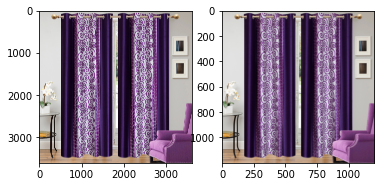

In [54]:
image = IMAGES[0]
im = imp.reduce_image_size(image, 0, data, write=True, scale_factor=3)
fig, (ax1, ax2) = plt.subplots(ncols=2)
ax1.imshow(image)
ax2.imshow(im)

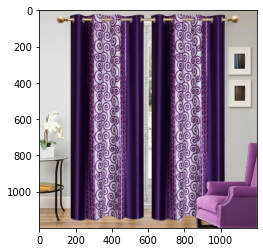

In [55]:
img = io.imread('55b85ea15a1536d46b7190ad6fff8ce7.jpg')
plt.imshow(img)

## II.4 Pipeline de prétraitement

Le pipeline de prétraitement est constitué des étapes suivantes:
- réduction de la taille
- étirement de l'histogramme
- normalisation de l'histogramme

Les deux étapes de prétraitement sur les histogrammes sont regroupées dans la fonction image_processing()

In [ ]:
# chargement des images réduites à partir du répertoire (à modifier, pour enchaîner directement la réduction
# de taille et le preprocessing)
images_reduced = []
path = PATH_TO_FLIPKART + 'images_reduced/'
#filelist = glob(path)

for i, im in enumerate(tqdm(IMAGES)):
    images_reduced.append(imp.reduce_image_size(im, i, data, write=True, scale_factor=3, path=path))

    #for f in tqdm(filelist):
    #images_reduced.append(load_images(f))
del IMAGES
#IMAGES_REDUCED = np.asarray(images_reduced, dtype='object')

# prétraitement des histogrammes sur les images réduites

In [122]:
im_corr = []
path = PATH_TO_FLIPKART + 'images_corrected/'
for i, im in enumerate(tqdm(images_reduced)):
    fname = path + data.image.iloc[i]
    preprocessed_image = imp.image_preprocessing(im)
    im_corr.append(preprocessed_image)
    mpimg.imsave(fname, preprocessed_image)

100%|██████████| 1050/1050 [00:47<00:00, 22.27it/s]


In [123]:
IM_CORR = np.asarray(im_corr, dtype='object')

In [124]:
del im_corr, preprocessed_image

In [58]:
# prétraitement des histogrammes sur les images originales
#im_corr = []
#for im in tqdm(IMAGES):
#    preprocessed_image = image_preprocessing(im)
#    im_corr.append(preprocessed_image)

#IM_CORR = np.asarray(im_corr, dtype='object')

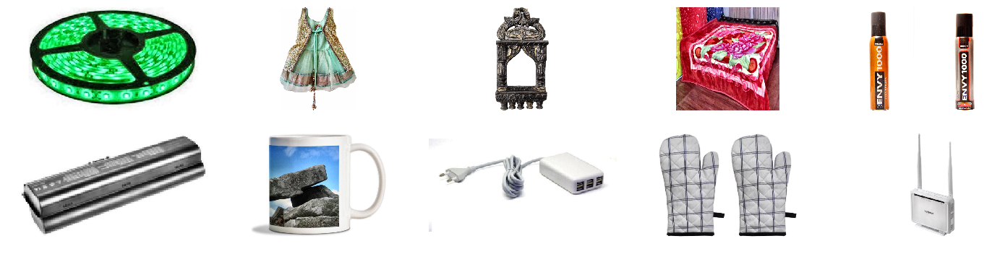

In [125]:
rng = default_rng()

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 5))
images_to_plot = rng.choice(IM_CORR, 10, replace=False)
for im, ax in zip(images_to_plot, axes.ravel()):
    ax.imshow(im)
    ax.axis('off')
fig.tight_layout()

In [60]:
del images_to_plot

# III Détection des features avec SIFT

On entre ici dans le vif du sujet, avec la détection des features par l'algorithme SIFT. On utilise pour ceci la bibliothèque opencv. Suivant la méthode standard, on cherchera en premier lieu à détecter les _features_ et à calculer les descripteurs, c'est-à-dire les vecteurs de taille 128 encodant les informations liées au voisinage des _features_. Puis on cherchera à construire l'ensemble des _bag of visual words_ à partir de ces descripteurs, en appliquant une première fois l'algorithme K-Means pour créer des clusters de descripteurs dont les centroïdes représentent les _visual words_. Enfin, on contruira, pour chaque image, l'histogramme de la fréquence d'apparition des _visual words_. Le vecteur obtenu, dont la longueur est égale au nombre de _visual words_ déterminés à l'étape précédente, peut être vu comme l'analogue d'un vecteur ligne de la matrice document-term obtenue par exemple avec le module CountVectorizer() de la bibliothèque scikit-learn. On pourra donc finalement réaliser une deuxième clustering sur les différents vecteurs de _visual words_ représentant chacun une image, pour grouper les images en catégories.

## III.1 Création des descripteurs

On commence par tester l'algorithme SIFT sur une image, avant de réaliser le traitement sur l'ensemble des images.

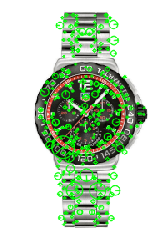


----------------------------------------
Descripteurs :  (395, 128)

[[ 44.  50.  15. ...   0.   0.  29.]
 [ 19. 124. 124. ...   3.   0.   0.]
 [107.  73.   3. ...   0.   1.   1.]
 ...
 [ 39.  23. 111. ...  14.  21.   5.]
 [ 52.   4.   6. ...   0. 119. 130.]
 [  8.  22.   8. ...   0.   0.   0.]]


In [134]:
rng = default_rng()

# création d'une instance SIFT
sift = cv2.SIFT_create()

# sélection d'une image parmi les images réduites et application de l'algorithme
#img  = rng.choice(IMAGES_REDUCED, 1)[0]
img = IM_CORR[9]
kp, des = sift.detectAndCompute(img, None)
out = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fig, ax = plt.subplots()
ax.imshow(out)
ax.axis('off')
plt.savefig('./images/sift_example.png', dpi=300)
plt.show()
print()
print('-'*40)
print("Descripteurs : ", des.shape)
print()
print(des)

On applique le traitement à l'ensemble des images. Les descripteurs sont rangés dans un tableau numpy, dont la taille dépend du nombre de _features_ détectées, qui dépendent elles-mêmes des caractéristiques des images en entrées, et particulièrement de leur taille. Ce tableau représente donc _l'ensemble_ des descripteurs, toutes images confondues. 

In [135]:
# création d'une instance SIFT
sift = cv2.SIFT_create()
sift_keypoints = []

for im in tqdm(IM_CORR) :
    kp, des = sift.detectAndCompute(im, None)
    sift_keypoints.append(des)

sift_keypoints_by_img = np.asarray(sift_keypoints, dtype='object')
sift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)

print("Nombre de descripteurs : ", sift_keypoints_all.shape)

100%|██████████| 1050/1050 [05:11<00:00,  3.37it/s]


Nombre de descripteurs :  (1201871, 128)


## III.2 Création des _visual words_

On cherche maintenant à retrouver les _visual words_ caractérisant notre jeu de données. Comme expliqué ci-dessus, on applique K-Means pour grouper les descripteurs, les centroïdes de chacun des groupes de descripteurs constituant les _visual words_. Le nombre de groupes recherchés est un hyperparamètre qu'il faut choisir, et pour des raisons de performance on choisira ici un nombre de groupes égal à la racine carrée du nombre de descripteurs.

In [136]:
# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  1096
Création de 1096 clusters de descripteurs ...
temps de traitement kmeans :            51.91 secondes


In [64]:
kmeans.cluster_centers_.shape

(1096, 128)

**On a donc retrouvé 1061 _visual words_ dans le jeu de données**

## III.3 Création des features des images
Il s'agit maintenant d'encoder les caractéristiques des images, c'est à dire de réaliser l'opération équivalente à la création de la matrice _document-term_ dans le cas d'une analyse de corpus textuel. Il faut compter le nombre de _visual words_ présent dans chaque image, et pour réaliser ceci on commence par identifier chaque descripteur à son groupe, et donc à son centroïde/_visual word_, puis on "compte" le nombre de fois que chaque _visual word_ apparaît dans chaque image.
* Pour chaque image on va donc: 
   - assigner chaque descripteur à un cluster (méhode predict() de la classe KMeans)
   - créer un histogramme qui représente le décompte pour chaque numéro de cluster du nombre de descripteurs de l'image

Exemple sur la première image

In [65]:
image_desc_0 = sift_keypoints_by_img[0]
image_desc_0.shape

(7845, 128)

La première image contient 7614 descripteurs.

En appliquant la méthode predict() de l'instance kmeans sur la première image, on trouve les _visual words_ associés aux descripteurs (un _visual word_ par descripteur). Ici, on aura donc un vecteur de taille 7614, dont chaque élement est un nombre compris entre 0 et 1060.

In [66]:
vw_hist = kmeans.predict(image_desc_0)
print('Visual words pour la première image:', vw_hist)
print('Nombre de visual words contenus dans l\'image:', len(np.unique(vw_hist)))
print('Les visual words sont repérés par un nombre compris entre {min} et {max}'.format(min=np.min(vw_hist), max=np.max(vw_hist)))

Visual words pour la première image: [261 441 286 ... 577 481 481]
Nombre de visual words contenus dans l'image: 937
Les visual words sont repérés par un nombre compris entre 0 et 1095


On crée maintenant l'histogramme des _visual words_. Pour chaque image, l'histogramme consiste en un vecteur de longueur le nombre de _visual words_ trouvés dans le jeu de données, et dont chaque élément représente la _fréquence_ avec laquelle chaque _visual word_ se trouve dans l'image. On réalise cela pour toutes les images, et on récupère la matrice contenant tous les histogrammes, dont chaque ligne correspond à une image.

In [137]:
# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(tqdm(sift_keypoints_by_img)) :
    hist = imp.build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

100%|██████████| 1050/1050 [00:55<00:00, 18.76it/s]


In [68]:
print('''La matrice des histogrammes contient {nb_lignes} lignes et {nb_col} colonnes, ce qui correspond bien au nombre 
d\'images selon les lignes et au nombre de visual words selon les colonnes'''.format(nb_lignes=im_features.shape[0],
                                                                                     nb_col=im_features.shape[1]))

La matrice des histogrammes contient 1050 lignes et 1096 colonnes, ce qui correspond bien au nombre 
d'images selon les lignes et au nombre de visual words selon les colonnes


## III.4 Réductions de dimension



On va maintenant chercher à déterminer si les caractéristiques des images (les histogrammes calculés à la partie précédente) peuvent permettre de séparer ces images en plusieurs groupes - idéalement les groupes correspondant aux catégories originales. Pour cela, on va chercher à afficher la matrice des histogrammes dans un plan 2D, grâce à l'algorithme t-SNE. Pour réduire le temps de calcul et améliorer la séparation des données via le t-SNE, on commence par réaliser une réduction dimensionnelle par PCA.

### III.4.1 Réduction de dimension PCA
* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

Dimensions dataset avant réduction PCA :  (1050, 1096)
Dimensions dataset après réduction PCA :  (1050, 414)


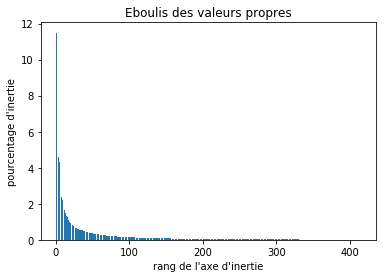

In [138]:
feat_pca = imp.run_pca(im_features, n_comp=0.99)

Même en gardant suffisamment de composantes pour retenir 99% de la variance du jeu de données, on diminue drastiquement le nombre de composantes.

### III.4.2 Réduction de dimension T-SNE
* Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [139]:
tsne = manifold.TSNE(n_components=2, perplexity=50, 
                     n_iter=5000, init='random', random_state=6)

X_tsne = tsne.fit_transform(feat_pca)
df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["product_category"]
print(df_tsne.shape)

/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:442: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:442: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  old_joblib = LooseVersion(joblib_version) < LooseVersion('0.12')
/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.p

(1050, 3)


### III.4.3 Analyse visuelle : affichage T-SNE selon les catégories d'images


L'analyse visuelle consiste ici à afficher les images dans un plan 2D, où chaque image a pour coordonnées les valeurs (x, y) déterminées par t-SNE. On applique ensuite un code de couleurs qui permet de rattacher chaque image au groupe auquel elle appartient (les catégories de niveau 0 extraites au début). Si des agglomérats de points apparaissent lors de la visualisation, et si ces agglomérats coïncident avec les groupes formés grâce aux couleurs utilisées, alors l'analyse aura permis de réaliser une segmentation efficace des images grâce à leurs caractéristiques.


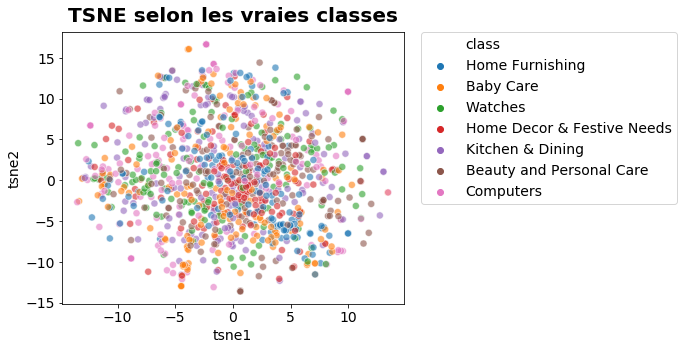

In [150]:
nb_categories = data.product_category.unique().size
fig, ax = plt.subplots(figsize=(10,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=nb_categories), s=50, alpha=0.6, ax=ax)

ax.set_title('TSNE selon les vraies classes', fontsize=20, pad=10, fontweight='bold')
ax.set_xlabel('tsne1', fontsize = 14)
ax.set_ylabel('tsne2', fontsize = 14)
ax.xaxis.set_tick_params(labelsize=14)
ax.yaxis.set_tick_params(labelsize=14)
ax.legend(prop={'size': 14}, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.subplots_adjust(right=0.6)
plt.savefig('./images/sift_clusters.png', dpi=300)
plt.show()

Le résultat est décevant... en effet aucun groupe ne semble se dégager. On va tout de même aller un peu plus loin, et calculer les score de Rand ajusté pour quantifier le clustering.

### III.4.4 Analyse mesures : similarité entre catégories et clusters

**Création de clusters à partir du T-SNE**

In [151]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

(1050, 4)


/anaconda3/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:444: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  max_iter=max_iter, verbose=verbose)
/anaconda3/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:444: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the re

In [152]:
df_tsne.head()

,tsne1,tsne2,class,cluster
0,-1.784105,1.843344,Home Furnishing,4
1,5.052394,-6.187741,Baby Care,0
2,2.912693,6.605297,Baby Care,3
3,5.628626,-4.762902,Home Furnishing,0
4,3.293882,-6.346952,Home Furnishing,0


**Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters**

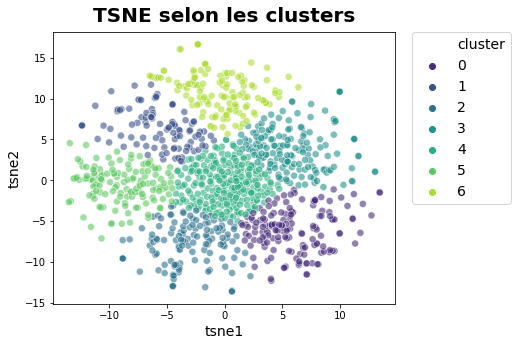

In [155]:
plt.figure(figsize=(10,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('viridis', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize=20, pad=10, fontweight='bold')
plt.xlabel('tsne1', fontsize=14)
plt.ylabel('tsne2', fontsize=14)
ax.xaxis.set_tick_params(labelsize=14)
ax.yaxis.set_tick_params(labelsize=14)
plt.legend(prop={'size': 14}, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 
plt.subplots_adjust(right=0.6)
plt.savefig('./images/sift_clusters_km.png', dpi=300)

plt.show()

**Correspondance catégories vs encodage**

In [75]:
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

ARI :  0.04079673303664447


Le score ARI est très proche de 0, ce qui signifie en pratique que la méthode utilisée ne permet pas la classification des images en groupes distincts. On va cependant explorer une deuxième méthode pour réaliser cette segmentation qui repose elle sur l'utilisation de réseaux de neurones à convolution et de la technique dite de transfer learning

# IV CNN et Transfer learning

Dans cette partie, on utilise un réseau de neurones à convolution (CNN) et on applique la technique de transfer learning pour classifier les images.  
Cette technique repose sur les étapes suivantes:
- chargement d'un modèle déjà entraîné dont on retire la dernière couche - celle permettant de réaliser la classification
- calcul des features de nos images en calculant le vecteur/la matrice obtenue grâce au CNN. Ce sont normalement ces features qui sont envoyées à la/aux dernière(s) couche(s) pour réaliser la classification

A partir de ces features, on répète les opérations dèjà effectuées lors de la partie précédente:
- réduction de dimension par PCA
- réduction de dimension et affichage 2D par t-SNE
- calcul du score ARI

## IV.1 Création et récupération des _features_ des images à partir du modèle pré entraîné

Création (récupération) du modèle. On enlève les couches de classification (include_top=False), mais on ajoute après la dernière couche de convolution une couche de pooling. En effet, il apparaît qu'ajouter une couche de pooling à ce stade améliore les performances de segmentation.

In [76]:
 # Charger VGG-16 pré-entraîné sur ImageNet et sans les couches fully-connected
model = vgg16.VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3), pooling='max')

# Les poids de ce modèle ne doivent pas être ré-entraînés. En réalite, cette ligne n'est pas utile ici, car la
# méthode fit() n'est jamais appelée.
model.trainable = False

# Définir le nouveau modèle
#new_model = Model(inputs=model.input, outputs=model.output)

58900480/58889256 [==============================] - 1s 0us/step


Création du corpus d'images formatées pour l'utilisation par le CNN.

In [77]:
images_cnn = []
for f in tqdm(data.image):
    path = PATH_TO_IMAGES + f
    img = load_img(path, target_size=(224, 224))  # Charger l'image)
    img = img_to_array(img)
    images_cnn.append(vgg16.preprocess_input(img))
IMAGES_CNN = np.asarray(images_cnn, dtype='object').astype('float32')
IMAGES_CNN.shape

# cette variable n'est plus utile
del images_cnn

100%|██████████| 1050/1050 [00:34<00:00, 30.18it/s]


In [78]:
# Compiler le modèle et l'afficher
model.compile()
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

On calcule maintenant les features pour chaque image. La matrice générée va jouer le même rôle que la matrice des histogrammes de visual words de la partie précédente.

In [79]:
features = model.predict(IMAGES_CNN)
print("Cette matrice contient {n_lignes} lignes et {n_col} features".format(n_lignes=features.shape[0],
                                                                    n_col=features.shape[1]))

Cette matrice contient 1050 lignes et 512 features


Pour éviter d'avoir à répéter les opérations précédentes on peut aussi charger le modèle qui a été calculé et sauvegardé lors d'une session précédente

In [80]:
#with open('features_array.pickle', 'wb') as f:
#  pickle.dump(features, f)

In [81]:
#!cp features_array.pickle ./drive/MyDrive/OpenClassrooms_projects/P6/
!cp ./drive/MyDrive/OpenClassrooms_projects/P6/features_array.pickle features_array.pickle
with open('features_array.pickle', 'rb') as f:
  features = pickle.load(f)

## Réduction de la dimension par PCA

On répète les opérations déjà réalisées lors de la précédente partie. Le but est d'évaluer visuellement, puis par calcul du score ARI si les images peuvent effectivement être groupées.

Dimensions dataset avant réduction PCA :  (1050, 512)
Dimensions dataset après réduction PCA :  (1050, 512)


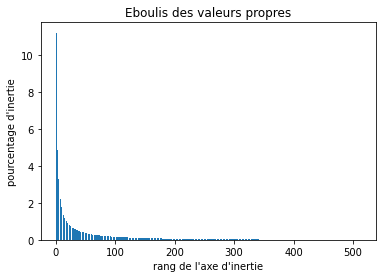

In [82]:
feat_pca_cnn = imp.run_pca(features, n_comp=512)

Après avoir réalisé plusieurs essais avec différents nombre de composantes retenues par PCA (différentes valeurs de ratios variance/variance totale), on décide de garder toutes les composantes. En effet, on obtient le meilleur ARI ainsi. 

## T-SNE

In [83]:
tsne = manifold.TSNE(n_components=2, perplexity=50, 
                     n_iter=5000, init='random', random_state=6)

X_tsne = tsne.fit_transform(feat_pca_cnn)
df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["product_category"]
print(df_tsne.shape)

(1050, 3)


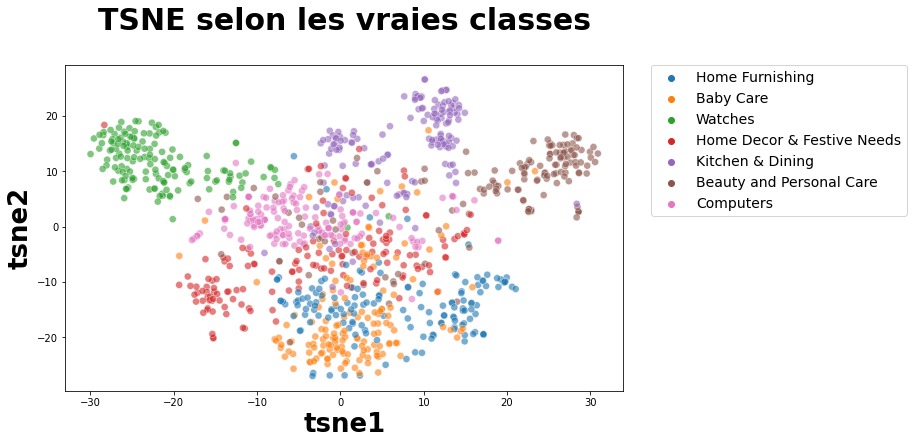

In [84]:
nb_categories = data.product_category.unique().size
fig, ax = plt.subplots(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=nb_categories), s=50, alpha=0.6, ax=ax)

ax.set_title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
ax.set_xlabel('tsne1', fontsize = 26, fontweight = 'bold')
ax.set_ylabel('tsne2', fontsize = 26, fontweight = 'bold')
ax.legend(prop={'size': 14}, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 

plt.show()

**Création de clusters à partir du T-SNE**

In [85]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

(1050, 4)


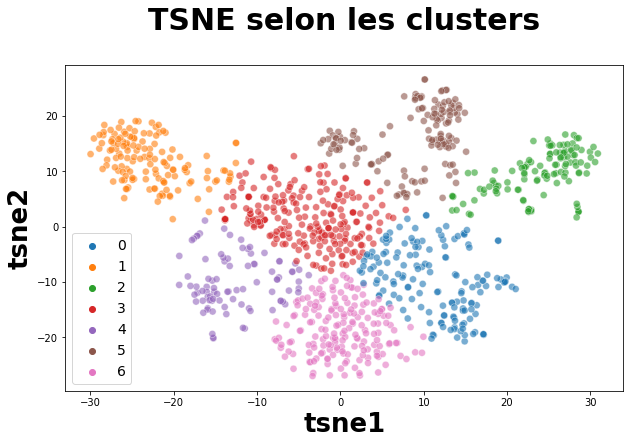

In [86]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

**Correspondance catégories vs encodage**

In [87]:
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

ARI :  0.4800149612497606


Le score ARI est beaucoup plus encourageant que précédemment. Ceci nous invite à aller un peu plus loin, et à inspecter la matrice de confusion de cette classification. 

**Analyse par classes**
* La matrice de confusion doit être transformée pour mettre en colonne le même ordre des catégories supposées qu'en ligne

On récupère l'encodage numérique des catégories réalisé en tout début de notebook (I.2 Préparation des catégories)

In [88]:
df_tsne["labels"] = labels
df_tsne.head()

,tsne1,tsne2,class,cluster,labels
0,17.484955,-10.744312,Home Furnishing,0,4
1,-5.486730,-16.004797,Baby Care,6,0
2,0.455498,-16.377687,Baby Care,6,0
3,10.737126,-17.419659,Home Furnishing,0,4
4,11.202093,-19.654181,Home Furnishing,0,4


Correspondance des clusters :  [4 6 1 2 3 5 0]


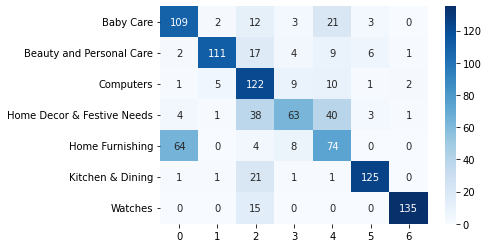

In [90]:
label_classes = np.unique(le.inverse_transform(labels))
labels_transform = custom.conf_mat_transform(labels, df_tsne['cluster'])
conf_mat = metrics.confusion_matrix(labels, labels_transform)
df_cm = pd.DataFrame(conf_mat, index = [label for label in np.unique(label_classes)],
                  columns = [i for i in "0123456"])

plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues", fmt='.0f')
plt.show()

In [91]:
print(metrics.classification_report(labels, labels_transform))

              precision    recall  f1-score   support

           0       0.60      0.73      0.66       150
           1       0.93      0.74      0.82       150
           2       0.53      0.81      0.64       150
           3       0.72      0.42      0.53       150
           4       0.48      0.49      0.49       150
           5       0.91      0.83      0.87       150
           6       0.97      0.90      0.93       150

    accuracy                           0.70      1050
   macro avg       0.73      0.70      0.71      1050
weighted avg       0.73      0.70      0.71      1050



Les scores obtenus, alors qu'aucun travail n'a été fait lors de l'utilisation du CNN, à part simplement calculer les features des images sont encourageants et invitent dans le cadre de la réalisation d'un moteur de classification à utiliser cette méthode en
- ajustant les poids en réentrainant une partie du modèle sur le jeu de données
- en ajustant les catégories recherchées.

Dans la dernière partie ci-dessous, on inspecte la première de ces solutions.

## IV.2 Modèle avec apprentissage partiel

Dans cette dernière partie, on va un peu plus loin avec les CNN, en cherchant à ajuster les poids du modèle pré-entraîné à notre jeu d'images. Le modèle de base est le même, mais on ajoute cette fois une couche Dense avec 7 unités de sortie puisque ça correspond à notre problème de segmentation/clustering. On entraîne ce nouveau modèle sur la totalité du jeu de données en laissant inchangés les poids des 5 premières couches - en d'autres termes, seuls les poids des couches 6 et plus élevées sont re-entraînes. On choisit cette configuration (plutôt que d'autres combinaisons de couches à entraîner vs couches à laisser inchangées) car elle permet déjà d'obtenir une amélioration substantielle par rapport au CNN non ré-entraîné et permet ainsi de démontrer la faisabilité de la classification.

In [ ]:
# Charger VGG-16 pré-entraîné sur ImageNet et sans les couches fully-connected
model = vgg16.VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3), pooling='avg')

# Récupérer la sortie de ce réseau
x = model.output

# Ajouter la nouvelle couche fully-connected pour la classification à 10 classes
predictions = layers.Dense(7, activation='softmax')(x)

# Ne pas entraîner les 5 premières couches (les plus basses) 
for layer in model.layers[:5]:
   layer.trainable = False

# Early stopping pour arrêter les itérations lorsque la précision vaut 1
callback = keras.callbacks.EarlyStopping(monitor='accuracy', patience=1)

# Définir le nouveau modèle
new_model = Model(inputs=model.input, outputs=predictions)

# Compiler le modèle 
opt = keras.optimizers.SGD(
    learning_rate=0.001, momentum=0.7
)

new_model.compile(loss="sparse_categorical_crossentropy", 
                  optimizer=opt,
                  metrics=["accuracy"])

# Entraîner sur les données d'entraînement (IMAGES_CNN, labels)
model_info = new_model.fit(IMAGES_CNN, labels, epochs=20, batch_size=32, verbose=2, callbacks=[callback])

Epoch 1/20
33/33 - 1367s - loss: 2.3851 - accuracy: 0.1610 - 1367s/epoch - 41s/step
Epoch 2/20


Au-delà d'environ 8-10 _epochs_, la précision ('accuracy') atteint 1, tandis que les pertes continuent de diminuer vers des valeurs de l'ordre de 0.001-0.0005. On utilise l'earlystopping pour arrêter automatiquement l'entraînement lorsque la précision ('accuracy') atteint 1. On est alors probablement dans une zone où le réseau est surentraîné, néanmoins à cause de la particularité de cette implémentation (on cherche simplement à réentraîner les poids du modèle, et non faire de la classification supervisée sur le jeu de données) et même si ce choix est finalement arbitraire, on se contentera de ces paramètres. 
Si on souhaitait utiliser ce réseau de neurones pour classifier de nouvelles images, alors il faudrait bien sur utiliser des jeux d'entraînement/validation/test et eventuellement d d'autres méthodes telles que la _data augmentation_, ou le dropout.
Ici cherche simplement à démontrer la possibilité d'utiliser un réeau de neurones pour extraires des features d'un jeu d'images permettant de réaliser une segmentation non-supervisée.

On extrait les features des images. Pour cela, on récupère les données en sortie de l'avant-dernière couche du réseau.

In [ ]:
output_layer = new_model.get_layer(index=len(new_model.layers)-2)
extractor = keras.Model(inputs=new_model.input, outputs=output_layer.output)
trained_feats = extractor.predict(IMAGES_CNN)

On réalise ensuite la même analyse que précédemment, sur les nouvelles features. La matrice en entrée est toujours de taille (1050, 512), ainsi le code est strictement le même que dans la partie précédente.

In [ ]:
tsne = manifold.TSNE(n_components=2, perplexity=50, 
                     n_iter=5000, init='random', random_state=6)

X_tsne = tsne.fit_transform(trained_feats)
df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["product_category"]

nb_categories = data.product_category.unique().size
fig, ax = plt.subplots(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=nb_categories), s=50, alpha=0.6, ax=ax)

ax.set_title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
ax.set_xlabel('tsne1', fontsize = 26, fontweight = 'bold')
ax.set_ylabel('tsne2', fontsize = 26, fontweight = 'bold')
ax.legend(prop={'size': 14}, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) 

plt.show()

Il apparaît déjà assez clairement que les features permettent une segmentation des images beaucoup plus performante après un réentraînement des poids, puisque l'on peut distinguer les clusters à l'oeil nu plus facilement.

On réalise maintenant la segmentation non supervisée à l'aide de K-Means...

In [ ]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

... et on calcule le score de Rand ajusté avec les "vraies" étiquettes.

In [ ]:
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

On atteint un score de 0.72, ce qui est nettement meilleur que les cores obtenus précédemment, toutes méthodes confondues.

In [ ]:
label_classes = np.unique(le.inverse_transform(labels))
labels_transform = conf_mat_transform(labels, df_tsne['cluster'])
conf_mat = metrics.confusion_matrix(labels, labels_transform)
df_cm = pd.DataFrame(conf_mat, index = [label for label in np.unique(label_classes)],
                  columns = [i for i in "0123456"])

plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues", fmt='.0f')
plt.show()

In [ ]:
print(metrics.classification_report(labels, labels_transform))

Finalement, les résultats de ce rapport de classification montrent bien la possibilité d'utiliser ce jeu d'images pour classifier les produits. Par rapport à l'utilisation de SIFT, on a démontré l'intérêt d'utiliser un CNN pour réaliser cette classification.